# Sentiment Analysis
---------------

In [38]:
import json
import pandas as pd
from selenium.webdriver.common.by import By
from selenium.common.exceptions import NoSuchElementException, ElementClickInterceptedException, StaleElementReferenceException
from selenium import webdriver
import os
from bs4 import BeautifulSoup
import time
from selenium import webdriver
from selenium.webdriver.firefox.service import Service
from selenium.webdriver.firefox.options import Options
import requests
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
import re
from datetime import datetime
import locale
import numpy as np
from selenium.common.exceptions import TimeoutException
from concurrent.futures import ThreadPoolExecutor
from lxml import html
from time import sleep
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer  # Uncomment if stemming is desired

from matplotlib import pyplot as plt
from sklearn.feature_extraction.text import TfidfTransformer, CountVectorizer, TfidfVectorizer
from sklearn.decomposition import TruncatedSVD


#warnings
import warnings
warnings.filterwarnings("ignore")



## Import Scraped Earnings Calls Transcripts From Both Companies RCL and NCLH
---------------


In [73]:
### reading csv file

# caribean_cruise = pd.read_csv('/Users/mathieu26/Desktop/DSDM-BSE/Term_2/Text_Mining_and_Natural_Lan_Processing/Final_Project/caribean_cruise.csv')
path = "/Users/amberwalker/Intro_text_nlp/final_project/"

df_rcl = pd.read_csv(path + r'royal_caribbean_cruises.csv')
df_nclh = pd.read_csv(path + r'norwegian_cruise_line.csv')
df_dal = pd.read_csv(path + r'delta_air_lines_.csv')
df_luv = pd.read_csv(path + r'southwest_airlines.csv')


## Verify Content of Earnings Calls Transcripts
---------------


In [6]:
# Loop through the DataFrame and print titles with empty 'CEO Text'
empty_ceo_entries = df_rcl[df_rcl['CEO Text'].isnull() | (df_rcl['CEO Text'] == '')]

if not empty_ceo_entries.empty:
    print("The following titles have empty CEO transcripts:")
    for index, row in empty_ceo_entries.iterrows():
        print(f"Title: {row['Title']}")
else:
    print("All CEO transcripts have been scraped.")


All CEO transcripts have been scraped.


Check CFO Transcripts

In [9]:
# Loop through the DataFrame and print titles with empty 'CEO Text'
empty_ceo_entries = df_luv[df_luv['CEO Text'].isnull() | (df_luv['CEO Text'] == '')]

if not empty_ceo_entries.empty:
    print("The following titles have empty CEO transcripts:")
    for index, row in empty_ceo_entries.iterrows():
        print(f"Title: {row['Title']}")
else:
    print("All CEO transcripts have been scraped.")


All CEO transcripts have been scraped.


In [11]:
# Print out the title of the transcript, its total word count, the first five words, and the last five words of each CEO speech
for index, row in df_dal.iterrows():
    title = row['Title']
    ceo_text = row['CEO Text']
    words = ceo_text.split()
    word_count = len(words)
    first_five_words = ' '.join(words[:5]) if word_count >= 5 else ' '.join(words)
    last_five_words = ' '.join(words[-5:]) if word_count >= 5 else ' '.join(words)
    print(f"Transcript Title: {title}")
    print(f"Total word count for CEO: {word_count}")
    print(f"First five words of CEO speech: {first_five_words}")
    print(f"Last five words of CEO speech: {last_five_words}\n")


Transcript Title: Delta Air Lines (DAL) Q4 2023 Earnings Call Transcript
Total word count for CEO: 1133
First five words of CEO speech: Well, thank you, Julie, and
Last five words of CEO speech: turn it over to Glen.

Transcript Title: Delta Air Lines (DAL) Q3 2023 Earnings Call Transcript
Total word count for CEO: 961
First five words of CEO speech: Well, thank you, Julie, and
Last five words of CEO speech: the details of the quarter.

Transcript Title: Delta Air Lines (DAL) Q2 2023 Earnings Call Transcript
Total word count for CEO: 879
First five words of CEO speech: Thanks, Julie. Good morning, everyone.
Last five words of CEO speech: the details of the quarter.

Transcript Title: Delta Air Lines (DAL) Q4 2022 Earnings Call Transcript
Total word count for CEO: 1128
First five words of CEO speech: Thank you, Julie. Good morning,
Last five words of CEO speech: turn it over to Glen.

Transcript Title: Delta Air Lines (DAL) Q3 2022 Earnings Call Transcript
Total word count for CEO: 958


In [564]:
# Print out the title of the transcript, its total word count, the first five words, and the last five words of each CEO speech
for index, row in df_nclh.iterrows():
    title = row['Title']
    ceo_text = row['CEO Text']
    words = ceo_text.split()
    word_count = len(words)
    first_five_words = ' '.join(words[:5]) if word_count >= 5 else ' '.join(words)
    last_five_words = ' '.join(words[-5:]) if word_count >= 5 else ' '.join(words)
    print(f"Transcript Title: {title}")
    print(f"Total word count for CEO: {word_count}")
    print(f"First five words of CEO speech: {first_five_words}")
    print(f"Last five words of CEO speech: {last_five_words}\n")

Transcript Title: Norwegian Cruise Line (NCLH) Q4 2023 Earnings Call Transcript
Total word count for CEO: 1879
First five words of CEO speech: Well, thank you, Sarah, and
Last five words of CEO speech: financial results and outlook. Mark?

Transcript Title: Norwegian Cruise Line (NCLH) Q3 2023 Earnings Call Transcript
Total word count for CEO: 2392
First five words of CEO speech: Well, thank you, Jessica, and
Last five words of CEO speech: financial results and outlook. Mark?

Transcript Title: Norwegian Cruise Line (NCLH) Q2 2023 Earnings Call Transcript
Total word count for CEO: 2299
First five words of CEO speech: Well, thank you, Jessica, and
Last five words of CEO speech: financial position and outlook. Mark?

Transcript Title: Norwegian Cruise Line (NCLH) Q1 2023 Earnings Call Transcript
Total word count for CEO: 742
First five words of CEO speech: Thank you, Jessica, and good
Last five words of CEO speech: have in the horizon. Harry?

Transcript Title: Norwegian Cruise Line (NCL

CFO

In [12]:
# Loop through the DataFrame and print titles with empty 'CFO Text'
empty_cfo_entries = df_dal[df_dal['CFO Text'].isnull() | (df_dal['CFO Text'] == '')]

if not empty_cfo_entries.empty:
    print("The following titles have empty CFO transcripts:")
    for index, row in empty_cfo_entries.iterrows():
        print(f"Title: {row['Title']}")
else:
    print("All CFO transcripts have been scraped.")


All CFO transcripts have been scraped.


In [13]:
# Loop through the DataFrame and print titles with empty 'CFO Text'
empty_cfo_entries = df_luv[df_luv['CFO Text'].isnull() | (df_luv['CFO Text'] == '')]

if not empty_cfo_entries.empty:
    print("The following titles have empty CFO transcripts:")
    for index, row in empty_cfo_entries.iterrows():
        print(f"Title: {row['Title']}")
else:
    print("All CFO transcripts have been scraped.")


All CFO transcripts have been scraped.


In [567]:
# Print out the title of the transcript, its total word count, the first and last five words of each CFO speech
for index, row in df_rcl.iterrows():
    title = row['Title']
    cfo_text = row['CFO Text']
    words = cfo_text.split()
    word_count = len(words)
    first_five_words = ' '.join(words[:5])
    last_five_words = ' '.join(words[-5:]) if word_count >= 5 else ' '.join(words)
    print(f"Transcript Title: {title}")
    print(f"Total word count for CFO: {word_count}")
    print(f"First five words of CFO speech: {first_five_words}")
    print(f"Last five words of CFO speech: {last_five_words}\n")


Transcript Title: Royal Caribbean Cruises (RCL) Q4 2023 Earnings Call Transcript
Total word count for CFO: 1584
First five words of CFO speech: Thank you, Jason, and good
Last five words of CFO speech: call for a question-and-answer session.

Transcript Title: Royal Caribbean Cruises (RCL) Q3 2023 Earnings Call Transcript
Total word count for CFO: 1435
First five words of CFO speech: Thank you, Jason, and good
Last five words of CFO speech: call for a question-and-answer session.

Transcript Title: Royal Caribbean Cruises (RCL) Q2 2023 Earnings Call Transcript
Total word count for CFO: 1267
First five words of CFO speech: Thank you, Jason, and good
Last five words of CFO speech: call for a question-and-answer session.

Transcript Title: Royal Caribbean Cruises (RCL) Q1 2023 Earnings Call Transcript
Total word count for CFO: 1171
First five words of CFO speech: Thank you, Jason, and good
Last five words of CFO speech: call for a question-and-answer session.

Transcript Title: Royal Cari

In [568]:
# Print out the title of the transcript, its total word count, the first and last five words of each CFO speech
for index, row in df_nclh.iterrows():
    title = row['Title']
    cfo_text = row['CFO Text']
    words = cfo_text.split()
    word_count = len(words)
    first_five_words = ' '.join(words[:5])
    last_five_words = ' '.join(words[-5:]) if word_count >= 5 else ' '.join(words)
    print(f"Transcript Title: {title}")
    print(f"Total word count for CFO: {word_count}")
    print(f"First five words of CFO speech: {first_five_words}")
    print(f"Last five words of CFO speech: {last_five_words}\n")


Transcript Title: Norwegian Cruise Line (NCLH) Q4 2023 Earnings Call Transcript
Total word count for CFO: 1717
First five words of CFO speech: Thank you, Harry, and good
Last five words of CFO speech: to Harry for closing remarks.

Transcript Title: Norwegian Cruise Line (NCLH) Q3 2023 Earnings Call Transcript
Total word count for CFO: 1356
First five words of CFO speech: Thank you, Harry, and good
Last five words of CFO speech: Harry for his closing comments.

Transcript Title: Norwegian Cruise Line (NCLH) Q2 2023 Earnings Call Transcript
Total word count for CFO: 1700
First five words of CFO speech: Thank you, Harry, and good
Last five words of CFO speech: to Harry for closing comments.

Transcript Title: Norwegian Cruise Line (NCLH) Q1 2023 Earnings Call Transcript
Total word count for CFO: 1358
First five words of CFO speech: Thank you, Harry, and good
Last five words of CFO speech: to Frank for closing comments.

Transcript Title: Norwegian Cruise Line (NCLH) Q4 2022 Earnings Call

## Preprocess Earnings Calls Transcripts
---------------


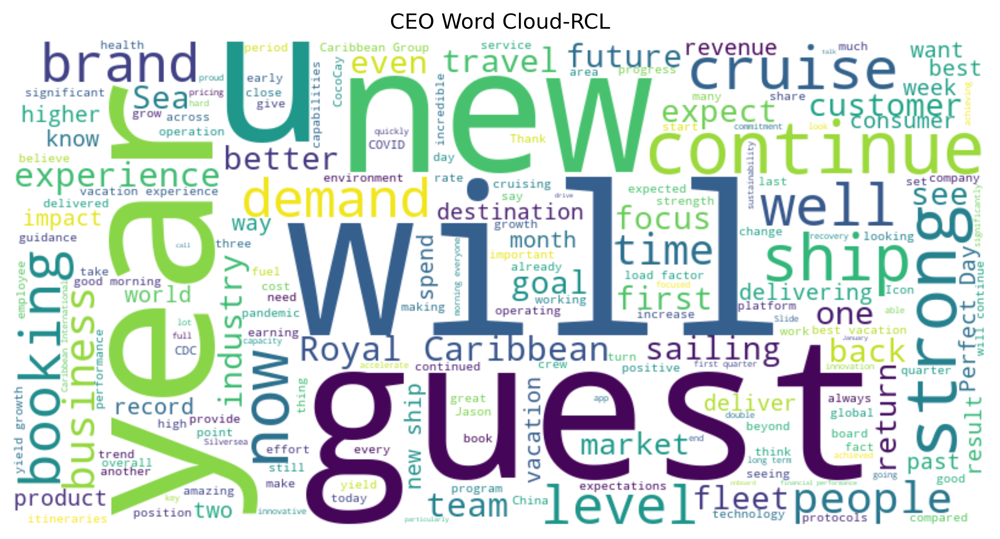

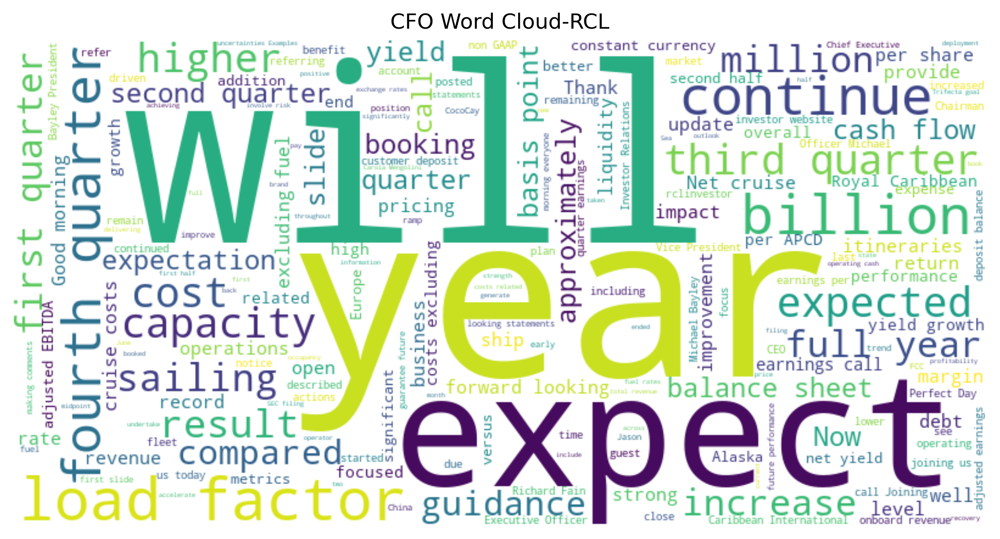

In [78]:
#!pip install wordcloud

class TextPreprocessor:
    def __init__(self, dataframe):
        self.df = dataframe

    def generate_wordcloud(self, text_column, title):
        # Combine all texts into one large string
        combined_text = " ".join(text for text in self.df[text_column])
        
        # Generate a word cloud image
        wordcloud = WordCloud(background_color='white', max_words=200, contour_color='steelblue', 
                              width=800, height=400).generate(combined_text)
        
        # Display the word cloud using matplotlib
        plt.figure(figsize=(10, 5), dpi=300)
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(title)
        plt.axis('off')  # Remove axis
        plt.show()

# Usage
# Assuming 'df' is your DataFrame containing the data
text_preprocessor = TextPreprocessor(df_rcl)

# Generate and display the word cloud for CEO Text
text_preprocessor.generate_wordcloud('CEO Text', 'CEO Word Cloud-RCL')

# Generate and display the word cloud for CFO Text
text_preprocessor.generate_wordcloud('CFO Text', 'CFO Word Cloud-RCL')


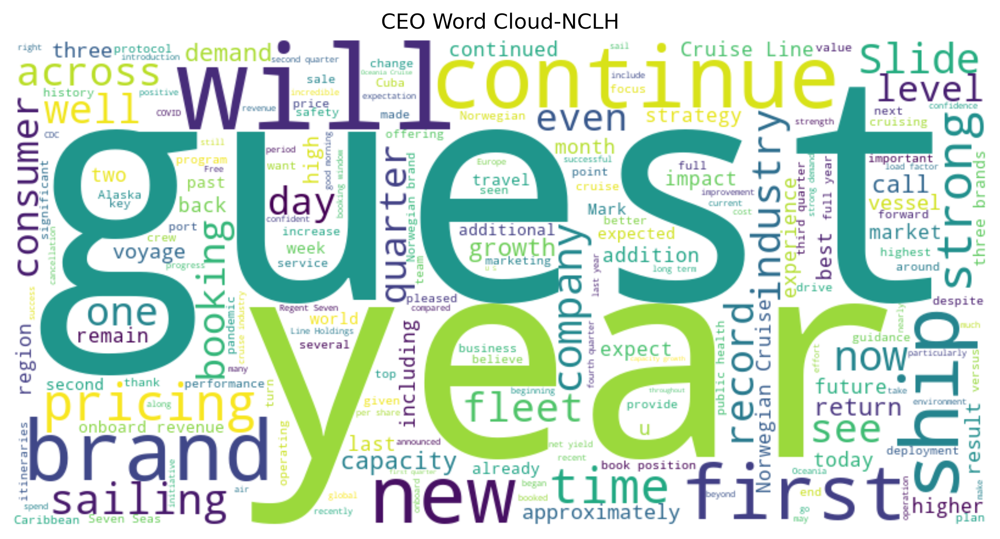

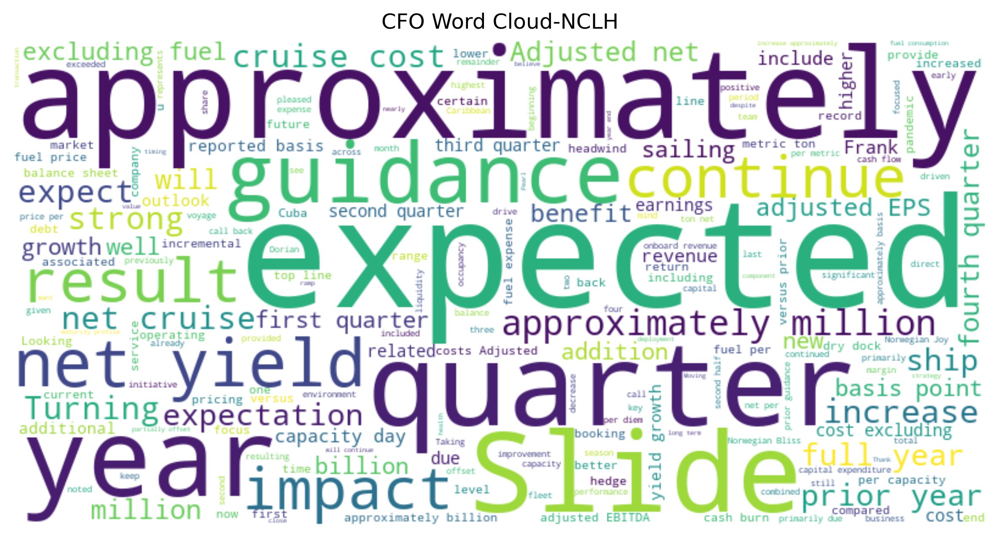

In [79]:
class TextPreprocessor:
    def __init__(self, dataframe):
        self.df = dataframe

    def generate_wordcloud(self, text_column, title):
        # Combine all texts into one large string
        combined_text = " ".join(text for text in self.df[text_column])
        
        # Generate a word cloud image
        wordcloud = WordCloud(background_color='white', max_words=200, contour_color='steelblue', 
                              width=800, height=400).generate(combined_text)
        
        # Display the word cloud using matplotlib
        plt.figure(figsize=(10, 5), dpi=300)
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(title)
        plt.axis('off')  # Remove axis
        plt.show()

# Usage
# Assuming 'df' is your DataFrame containing the data
text_preprocessor = TextPreprocessor(df_nclh)

# Generate and display the word cloud for CEO Text
text_preprocessor.generate_wordcloud('CEO Text', 'CEO Word Cloud-NCLH')

# Generate and display the word cloud for CFO Text
text_preprocessor.generate_wordcloud('CFO Text', 'CFO Word Cloud-NCLH')


In [80]:
class TextAnalyzer:
    def __init__(self, dataframe):
        self.df = dataframe
        nltk.download('stopwords')

    @staticmethod
    def remove_html_tags(text):
        pattern = re.compile('<.*?>')
        return pattern.sub('', text)

    @staticmethod
    def preprocess_text(text):
        # Lowercasing
        text = text.lower()
        # Remove HTML tags
        text = TextAnalyzer.remove_html_tags(text)
        # Remove special characters and punctuation
        text = re.sub(r'[^\w\s]+', '', text)
        # Remove numbers
        #text = re.sub(r'\d+', '', text)
        # Remove stopwords
        stop_words = set(stopwords.words('english'))
        text = ' '.join([word for word in text.split() if word not in stop_words])
        #Stemming (optional, uncomment if needed)
        stemmer = PorterStemmer()
        text = ' '.join([stemmer.stem(word) for word in text.split()])
        # Remove extra spaces
        text = text.strip().replace(r'\s+', ' ')
        return text

    def apply_preprocessing(self):
        self.df['CEO Text Cleaned'] = self.df['CEO Text'].apply(self.preprocess_text)
        self.df['CFO Text Cleaned'] = self.df['CFO Text'].apply(self.preprocess_text)

# Usage
# Assuming 'df' is your DataFrame containing the data
text_analyzer = TextAnalyzer(df_rcl)
text_analyzer.apply_preprocessing()

# Rename the DataFrame to df_preprocessed
df_preprocessed_rcl = text_analyzer.df

# Now, df_preprocessed will have additional columns for preprocessed CEO and CFO texts
df_preprocessed_rcl.head(20)


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/amberwalker/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned
0,Royal Caribbean Cruises (RCL) Q4 2023 Earnings...,"Feb 01, 2024","Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning everyone. L...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon get detail wou...,thank jason good morn everyon let start review...
1,Royal Caribbean Cruises (RCL) Q3 2023 Earnings...,"Oct 26, 2023","Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon begin today wo...,thank jason good morn everyon let start thirdq...
2,Royal Caribbean Cruises (RCL) Q2 2023 Earnings...,"Jul 27, 2023","Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon im thrill shar...,thank jason good morn everyon begin discuss re...
3,Royal Caribbean Cruises (RCL) Q1 2023 Earnings...,"May 04, 2023","Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon im thrill morn...,thank jason good morn everyon let begin discus...
4,Royal Caribbean Cruises (RCL) Q4 2022 Earnings...,"Feb 07, 2023","Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon get start beha...,thank jason good morn everyon let begin discus...
5,Royal Caribbean (RCL) Q3 2022 Earnings Call Tr...,"Nov 03, 2022","Thank you, Michael, and good morning, everyone...","Thank you, Jason. Good morning, everyone. Let ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon past sever mon...,thank jason good morn everyon let begin discus...
6,Royal Caribbean (RCL) Q2 2022 Earnings Call Tr...,"Jul 28, 2022","Thank you, Michael. Good morning, everyone, an...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon thank join us ...,thank jason good morn everyon let begin discus...
7,Royal Caribbean (RCL) Q1 2022 Earnings Call Tr...,"May 05, 2022","Thank you, Michael. Good morning, everyone, an...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon thank join us ...,thank jason good morn everyon let begin discus...
8,Royal Caribbean (RCL) Q4 2021 Earnings Call Tr...,"Feb 04, 2022","Thank you, Michael, and good morning, everyone...","Thank you, Jason. Before I begin my remarks, I...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon im pleas today...,thank jason begin remark would like share ener...
9,Royal Caribbean (RCL) Q3 2021 Earnings Call Tr...,"Oct 29, 2021","Thank you, Jason and good morning, everyone. A...","Good morning, everyone and thank you for joini...",https://www.fool.com/earnings/call-transcripts...,thank jason good morn everyon alway pleasur gi...,good morn everyon thank join us today busi upd...


In [81]:
class TextAnalyzer:
    def __init__(self, dataframe):
        self.df = dataframe
        nltk.download('stopwords')

    @staticmethod
    def remove_html_tags(text):
        pattern = re.compile('<.*?>')
        return pattern.sub('', text)

    @staticmethod
    def preprocess_text(text):
        # Lowercasing
        text = text.lower()
        # Remove HTML tags
        text = TextAnalyzer.remove_html_tags(text)
        # Remove special characters and punctuation
        text = re.sub(r'[^\w\s]+', '', text)
        # Remove numbers
        #text = re.sub(r'\d+', '', text)
        # Remove stopwords
        stop_words = set(stopwords.words('english'))
        text = ' '.join([word for word in text.split() if word not in stop_words])
        #Stemming (optional, uncomment if needed)
        stemmer = PorterStemmer()
        text = ' '.join([stemmer.stem(word) for word in text.split()])
        # Remove extra spaces
        text = text.strip().replace(r'\s+', ' ')
        return text

    def apply_preprocessing(self):
        self.df['CEO Text Cleaned'] = self.df['CEO Text'].apply(self.preprocess_text)
        self.df['CFO Text Cleaned'] = self.df['CFO Text'].apply(self.preprocess_text)

# Usage
# Assuming 'df' is your DataFrame containing the data
text_analyzer = TextAnalyzer(df_nclh)
text_analyzer.apply_preprocessing()

# Rename the DataFrame to df_preprocessed
df_preprocessed_nclh = text_analyzer.df

# Now, df_preprocessed will have additional columns for preprocessed CEO and CFO texts
df_preprocessed_nclh.head(20)


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/amberwalker/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned
0,Norwegian Cruise Line (NCLH) Q4 2023 Earnings ...,"Feb 27, 2024","Well, thank you, Sarah, and good morning, ever...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,well thank sarah good morn everyon thank join ...,thank harri good morn everyon commentari today...
1,Norwegian Cruise Line (NCLH) Q3 2023 Earnings ...,"Nov 01, 2023","Well, thank you, Jessica, and good morning, ev...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,well thank jessica good morn everyon thank joi...,thank harri good morn everyon commentari today...
2,Norwegian Cruise Line (NCLH) Q2 2023 Earnings ...,"Aug 01, 2023","Well, thank you, Jessica, and good morning, ev...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,well thank jessica good morn everyon thank joi...,thank harri good morn everyon commentari today...
3,Norwegian Cruise Line (NCLH) Q1 2023 Earnings ...,"May 01, 2023","Thank you, Jessica, and good morning, everyone...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank harri good morn everyon dive financi res...
4,Norwegian Cruise Line (NCLH) Q4 2022 Earnings ...,"Feb 28, 2023","Thank you, Jessica, and good morning, everyone...","Thank you, Frank, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank frank good morn everyon commentari today...
5,Norwegian Cruise Line Holdings (NCLH) Q3 2022 ...,"Nov 08, 2022","Thank you, Jessica, and good morning, everyone...","Thank you, Frank, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank frank good morn everyon commentari today...
6,Norwegian Cruise Line Holdings (NCLH) Q2 2022 ...,"Aug 09, 2022","Thank you, Jessica, and good morning, everyone...","Thank you, Frank, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank frank good morn everyon begin commentari...
7,Norwegian Cruise Line Holdings (NCLH) Q1 2022 ...,"May 10, 2022","Thank you, Jessica, and good morning, everyone...","Thank you, Frank, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank frank good morn everyon begin commentari...
8,Norwegian Cruise Line Holdings (NCLH) Q4 2021 ...,"Feb 24, 2022","Thank you, Mark, and good morning, everyone, a...","Thank you, Maria, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank mark good morn everyon thank join us tod...,thank maria good morn everyon thank join frank...
9,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,"Nov 3, 2021",Thank you Jessica. And good morning everyone. ...,"Thank you, Frank. We reached a significant fin...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank frank reach signific financi mileston th...


In [82]:
#remove any points from date column
df_preprocessed_rcl['Date'] = df_rcl['Date'].str.replace('.', '')
df_preprocessed_nclh['Date'] = df_nclh['Date'].str.replace('.', '')

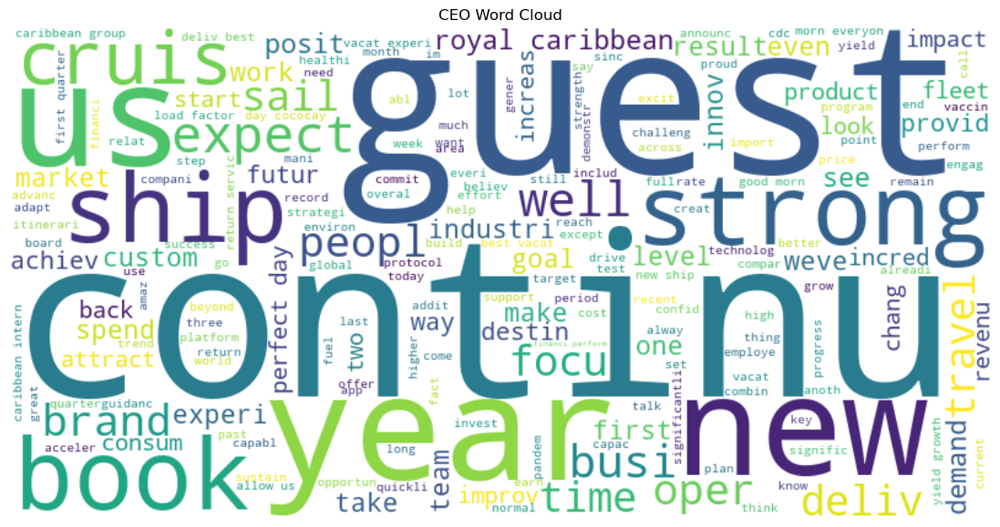

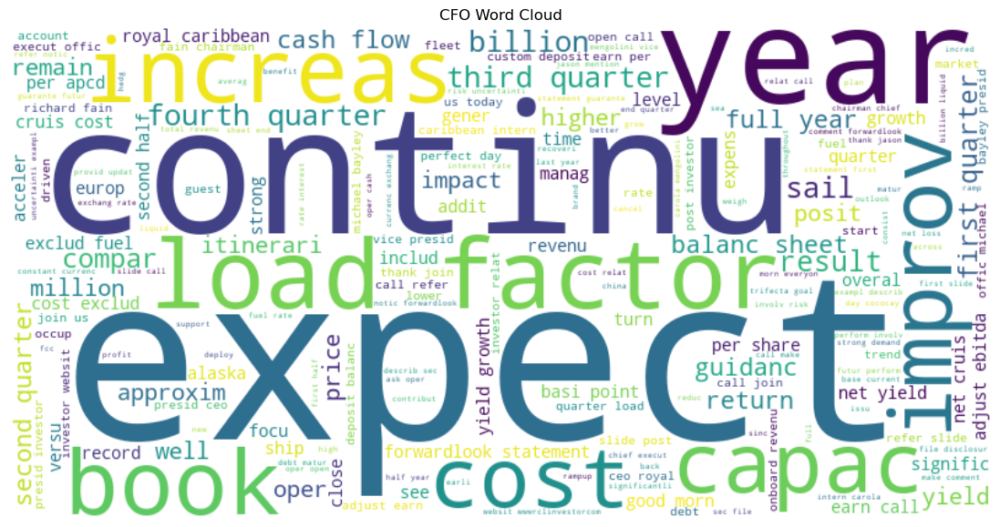

In [83]:
# Concatenate all the cleaned text into a single string for each role
ceo_text_all = " ".join(text for text in df_preprocessed_rcl['CEO Text Cleaned'].dropna())
cfo_text_all = " ".join(text for text in df_preprocessed_rcl['CFO Text Cleaned'].dropna())

# Define a function to plot a word cloud
def plot_word_cloud(text, title, colormap='viridis', figsize=(14, 7)):
    wordcloud = WordCloud(background_color="white", colormap=colormap, width=800, height=400).generate(text)
    plt.figure(figsize=figsize)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')

# Generate and display word clouds
plot_word_cloud(ceo_text_all, 'CEO Word Cloud')
plot_word_cloud(cfo_text_all, 'CFO Word Cloud')

# Show the final plot
plt.show()


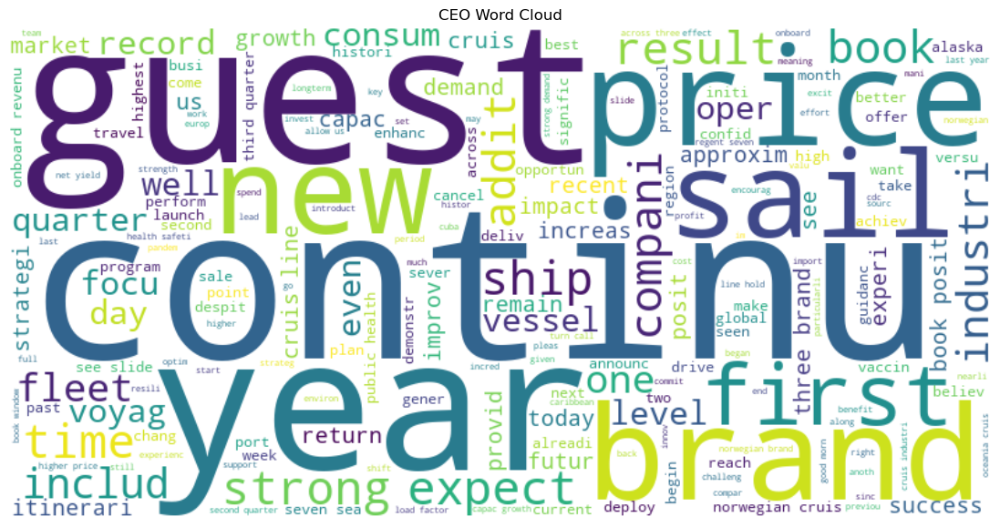

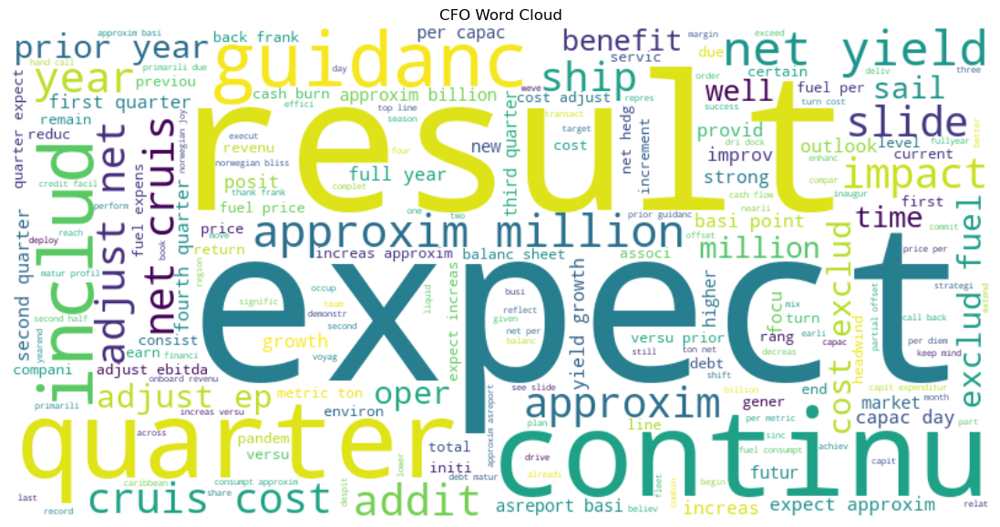

In [84]:
# Concatenate all the cleaned text into a single string for each role
ceo_text_all = " ".join(text for text in df_preprocessed_nclh['CEO Text Cleaned'].dropna())
cfo_text_all = " ".join(text for text in df_preprocessed_nclh['CFO Text Cleaned'].dropna())

# Define a function to plot a word cloud
def plot_word_cloud(text, title, colormap='viridis', figsize=(14, 7)):
    wordcloud = WordCloud(background_color="white", colormap=colormap, width=800, height=400).generate(text)
    plt.figure(figsize=figsize)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')

# Generate and display word clouds
plot_word_cloud(ceo_text_all, 'CEO Word Cloud')
plot_word_cloud(cfo_text_all, 'CFO Word Cloud')

# Show the final plot
plt.show()

## Sentiment Analysis
--------

In [23]:
# Define the path to your file
file_path = path + r'Loughran-McDonald_MasterDictionary_1993-2023.csv'

# Read the file into a pandas DataFrame
master_dictionary_df = pd.read_csv(file_path)

# Display the first few rows of the DataFrame to verify
master_dictionary_df.head(20)


,Word,Seq_num,Word Count,Word Proportion,Average Proportion,Std Dev,Doc Count,Negative,Positive,Uncertainty,Litigious,Strong_Modal,Weak_Modal,Constraining,Complexity,Syllables,Source
0,AARDVARK,1,664,2.690000e-08,1.860000e-08,4.050000e-06,131,0,0,0,0,0,0,0,0,2,12of12inf
1,AARDVARKS,2,3,1.210000e-10,8.230000e-12,9.020000e-09,1,0,0,0,0,0,0,0,0,2,12of12inf
2,ABACI,3,9,3.640000e-10,1.110000e-10,5.160000e-08,7,0,0,0,0,0,0,0,0,3,12of12inf
3,ABACK,4,29,1.170000e-09,6.330000e-10,1.560000e-07,28,0,0,0,0,0,0,0,0,2,12of12inf
4,ABACUS,5,9349,3.790000e-07,3.830000e-07,3.460000e-05,1239,0,0,0,0,0,0,0,0,3,12of12inf
5,ABACUSES,6,0,0.000000e+00,0.000000e+00,0.000000e+00,0,0,0,0,0,0,0,0,0,4,12of12inf
6,ABAFT,7,4,1.620000e-10,2.190000e-11,2.400000e-08,1,0,0,0,0,0,0,0,0,2,12of12inf
7,ABALONE,8,147,5.950000e-09,4.810000e-09,1.040000e-06,51,0,0,0,0,0,0,0,0,4,12of12inf
8,ABALONES,9,1,4.050000e-11,7.880000e-11,8.630000e-08,1,0,0,0,0,0,0,0,0,4,12of12inf
9,ABANDON,10,146131,5.920000e-06,4.800000e-06,3.280000e-05,73436,2009,0,0,0,0,0,0,0,3,12of12inf


In [24]:
class LoughranMcDonaldSentimentAnalyzer:
    def __init__(self, df_preprocessed, master_dictionary_df):
        self.df = df_preprocessed
        self.master_dictionary_df = master_dictionary_df
        self.sentiment_words = self._extract_sentiment_words()

    def _extract_sentiment_words(self):
        sentiments = ['Negative', 'Positive', 'Uncertainty', 'Litigious', 'Constraining']
        sentiment_words = {}
        for sentiment in sentiments:
            sentiment_words[sentiment] = set(self.master_dictionary_df[
                self.master_dictionary_df[sentiment] != 0]['Word'].str.upper().tolist())
        return sentiment_words

    def count_sentiment_words(self, text, sentiment):
        words = text.upper().split()
        return sum(word in self.sentiment_words[sentiment] for word in words)

    def apply_sentiment_analysis(self):
        for sentiment in self.sentiment_words.keys():
            self.df[f'CEO {sentiment} Count'] = self.df['CEO Text Cleaned'].apply(
                lambda x: self.count_sentiment_words(x, sentiment))
            self.df[f'CFO {sentiment} Count'] = self.df['CFO Text Cleaned'].apply(
                lambda x: self.count_sentiment_words(x, sentiment))

    def calculate_net_sentiment_score(self):
        self.df['CEO Sentiment Score'] = self.df['CEO Positive Count'] - self.df['CEO Negative Count']
        self.df['CFO Sentiment Score'] = self.df['CFO Positive Count'] - self.df['CFO Negative Count']

    def standardize_dates(self):
        self.df['Date'] = pd.to_datetime(self.df['Date'], errors='coerce').dt.date

# Usage example
sentiment_analyzer = LoughranMcDonaldSentimentAnalyzer(df_preprocessed_rcl, master_dictionary_df)
sentiment_analyzer.apply_sentiment_analysis()
sentiment_analyzer.calculate_net_sentiment_score()
sentiment_analyzer.standardize_dates()

# Display the DataFrame to verify changes
df_lm_rcl = sentiment_analyzer.df
df_lm_rcl.head(10)


,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned,CEO Negative Count,CFO Negative Count,CEO Positive Count,CFO Positive Count,CEO Uncertainty Count,CFO Uncertainty Count,CEO Litigious Count,CFO Litigious Count,CEO Constraining Count,CFO Constraining Count,CEO Sentiment Score,CFO Sentiment Score
0,Royal Caribbean Cruises (RCL) Q4 2023 Earnings...,2024-02-01,"Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning everyone. L...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon get detail wou...,thank jason good morn everyon let start review...,2,6,36,17,0,3,1,2,2,2,34,11
1,Royal Caribbean Cruises (RCL) Q3 2023 Earnings...,2023-10-26,"Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon begin today wo...,thank jason good morn everyon let start thirdq...,7,3,44,16,0,1,2,0,1,2,37,13
2,Royal Caribbean Cruises (RCL) Q2 2023 Earnings...,2023-07-27,"Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon im thrill shar...,thank jason good morn everyon begin discuss re...,4,1,37,17,3,2,2,0,1,1,33,16
3,Royal Caribbean Cruises (RCL) Q1 2023 Earnings...,2023-05-04,"Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon im thrill morn...,thank jason good morn everyon let begin discus...,4,5,53,27,0,0,1,0,3,3,49,22
4,Royal Caribbean Cruises (RCL) Q4 2022 Earnings...,2023-02-07,"Thank you, Michael, and good morning, everyone...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon get start beha...,thank jason good morn everyon let begin discus...,3,14,29,18,1,1,2,0,2,2,26,4
5,Royal Caribbean (RCL) Q3 2022 Earnings Call Tr...,2022-11-03,"Thank you, Michael, and good morning, everyone...","Thank you, Jason. Good morning, everyone. Let ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon past sever mon...,thank jason good morn everyon let begin discus...,3,8,47,21,6,1,2,0,1,2,44,13
6,Royal Caribbean (RCL) Q2 2022 Earnings Call Tr...,2022-07-28,"Thank you, Michael. Good morning, everyone, an...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon thank join us ...,thank jason good morn everyon let begin discus...,4,7,39,11,1,4,2,0,1,0,35,4
7,Royal Caribbean (RCL) Q1 2022 Earnings Call Tr...,2022-05-05,"Thank you, Michael. Good morning, everyone, an...","Thank you, Jason, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon thank join us ...,thank jason good morn everyon let begin discus...,12,11,31,5,3,0,2,4,2,0,19,-6
8,Royal Caribbean (RCL) Q4 2021 Earnings Call Tr...,2022-02-04,"Thank you, Michael, and good morning, everyone...","Thank you, Jason. Before I begin my remarks, I...",https://www.fool.com/earnings/call-transcripts...,thank michael good morn everyon im pleas today...,thank jason begin remark would like share ener...,6,15,23,10,5,5,1,1,2,0,17,-5
9,Royal Caribbean (RCL) Q3 2021 Earnings Call Tr...,2021-10-29,"Thank you, Jason and good morning, everyone. A...","Good morning, everyone and thank you for joini...",https://www.fool.com/earnings/call-transcripts...,thank jason good morn everyon alway pleasur gi...,good morn everyon thank join us today busi upd...,10,1,18,1,11,1,2,1,2,0,8,0


In [25]:
class LoughranMcDonaldSentimentAnalyzer:
    def __init__(self, df_preprocessed, master_dictionary_df):
        self.df = df_preprocessed
        self.master_dictionary_df = master_dictionary_df
        self.sentiment_words = self._extract_sentiment_words()

    def _extract_sentiment_words(self):
        sentiments = ['Negative', 'Positive', 'Uncertainty', 'Litigious', 'Constraining']
        sentiment_words = {}
        for sentiment in sentiments:
            sentiment_words[sentiment] = set(self.master_dictionary_df[
                self.master_dictionary_df[sentiment] != 0]['Word'].str.upper().tolist())
        return sentiment_words

    def count_sentiment_words(self, text, sentiment):
        words = text.upper().split()
        return sum(word in self.sentiment_words[sentiment] for word in words)

    def apply_sentiment_analysis(self):
        for sentiment in self.sentiment_words.keys():
            self.df[f'CEO {sentiment} Count'] = self.df['CEO Text Cleaned'].apply(
                lambda x: self.count_sentiment_words(x, sentiment))
            self.df[f'CFO {sentiment} Count'] = self.df['CFO Text Cleaned'].apply(
                lambda x: self.count_sentiment_words(x, sentiment))

    def calculate_net_sentiment_score(self):
        self.df['CEO Sentiment Score'] = self.df['CEO Positive Count'] - self.df['CEO Negative Count']
        self.df['CFO Sentiment Score'] = self.df['CFO Positive Count'] - self.df['CFO Negative Count']

    def standardize_dates(self):
        self.df['Date'] = pd.to_datetime(self.df['Date'], errors='coerce').dt.date

# Usage example
sentiment_analyzer = LoughranMcDonaldSentimentAnalyzer(df_preprocessed_nclh, master_dictionary_df)
sentiment_analyzer.apply_sentiment_analysis()
sentiment_analyzer.calculate_net_sentiment_score()
sentiment_analyzer.standardize_dates()

# Display the DataFrame to verify changes
df_lm_nclh = sentiment_analyzer.df
df_lm_nclh.head(20)


,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned,CEO Negative Count,CFO Negative Count,CEO Positive Count,CFO Positive Count,CEO Uncertainty Count,CFO Uncertainty Count,CEO Litigious Count,CFO Litigious Count,CEO Constraining Count,CFO Constraining Count,CEO Sentiment Score,CFO Sentiment Score
0,Norwegian Cruise Line (NCLH) Q4 2023 Earnings ...,2024-02-27,"Well, thank you, Sarah, and good morning, ever...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,well thank sarah good morn everyon thank join ...,thank harri good morn everyon commentari today...,6,4,36,21,3,4,1,1,3,3,30,17
1,Norwegian Cruise Line (NCLH) Q3 2023 Earnings ...,2023-11-01,"Well, thank you, Jessica, and good morning, ev...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,well thank jessica good morn everyon thank joi...,thank harri good morn everyon commentari today...,19,9,31,15,1,0,4,3,4,1,12,6
2,Norwegian Cruise Line (NCLH) Q2 2023 Earnings ...,2023-08-01,"Well, thank you, Jessica, and good morning, ev...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,well thank jessica good morn everyon thank joi...,thank harri good morn everyon commentari today...,9,5,34,17,4,1,3,2,2,4,25,12
3,Norwegian Cruise Line (NCLH) Q1 2023 Earnings ...,2023-05-01,"Thank you, Jessica, and good morning, everyone...","Thank you, Harry, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank harri good morn everyon dive financi res...,2,4,10,12,0,1,0,3,0,4,8,8
4,Norwegian Cruise Line (NCLH) Q4 2022 Earnings ...,2023-02-28,"Thank you, Jessica, and good morning, everyone...","Thank you, Frank, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank frank good morn everyon commentari today...,8,4,18,9,2,0,7,2,1,9,10,5
5,Norwegian Cruise Line Holdings (NCLH) Q3 2022 ...,2022-11-08,"Thank you, Jessica, and good morning, everyone...","Thank you, Frank, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank frank good morn everyon commentari today...,12,7,20,12,3,2,4,3,2,4,8,5
6,Norwegian Cruise Line Holdings (NCLH) Q2 2022 ...,2022-08-09,"Thank you, Jessica, and good morning, everyone...","Thank you, Frank, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank frank good morn everyon begin commentari...,16,9,20,13,1,2,6,4,4,7,4,4
7,Norwegian Cruise Line Holdings (NCLH) Q1 2022 ...,2022-05-10,"Thank you, Jessica, and good morning, everyone...","Thank you, Frank, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank frank good morn everyon begin commentari...,16,9,31,18,4,2,4,0,2,5,15,9
8,Norwegian Cruise Line Holdings (NCLH) Q4 2021 ...,2022-02-24,"Thank you, Mark, and good morning, everyone, a...","Thank you, Maria, and good morning, everyone. ...",https://www.fool.com/earnings/call-transcripts...,thank mark good morn everyon thank join us tod...,thank maria good morn everyon thank join frank...,20,1,26,1,12,1,1,0,6,0,6,0
9,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,2021-11-03,Thank you Jessica. And good morning everyone. ...,"Thank you, Frank. We reached a significant fin...",https://www.fool.com/earnings/call-transcripts...,thank jessica good morn everyon thank join us ...,thank frank reach signific financi mileston th...,12,1,29,7,5,2,15,0,4,5,17,6


## Sentiment Scores Plots

---------

Sentiment Score = Count of Positive Words - Count of Negative Words

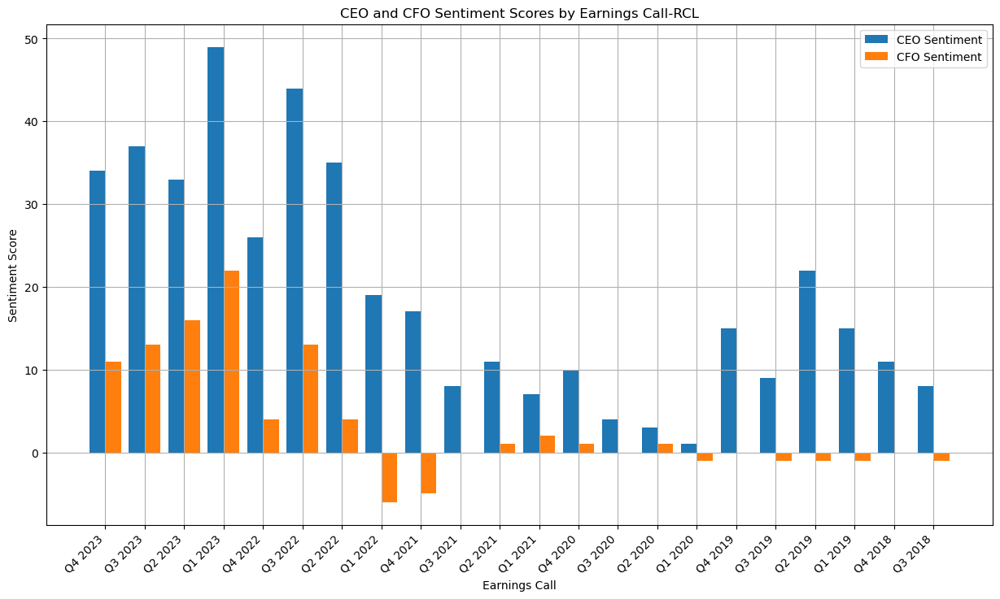

In [26]:
# Extracting relevant part from the 'Title'
df_lm_rcl['Earnings Call'] = df_lm_rcl['Title'].str.extract(r'\(RCL\) (.*?) Earnings')

plt.figure(figsize=(15, 8))  # Adjust the figure size as needed

# Plotting bar chart
x = range(len(df_lm_rcl))
plt.bar([a - 0.2 for a in x], df_lm_rcl['CEO Sentiment Score'], width=0.4, label='CEO Sentiment', align='center')
plt.bar([a + 0.2 for a in x], df_lm_rcl['CFO Sentiment Score'], width=0.4, label='CFO Sentiment', align='center')

# Formatting the plot
plt.xlabel('Earnings Call')
plt.ylabel('Sentiment Score')
plt.title('CEO and CFO Sentiment Scores by Earnings Call-RCL')
plt.xticks(x, df_lm_rcl['Earnings Call'], rotation=45, ha='right')  # Use the extracted part for x-axis labels
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


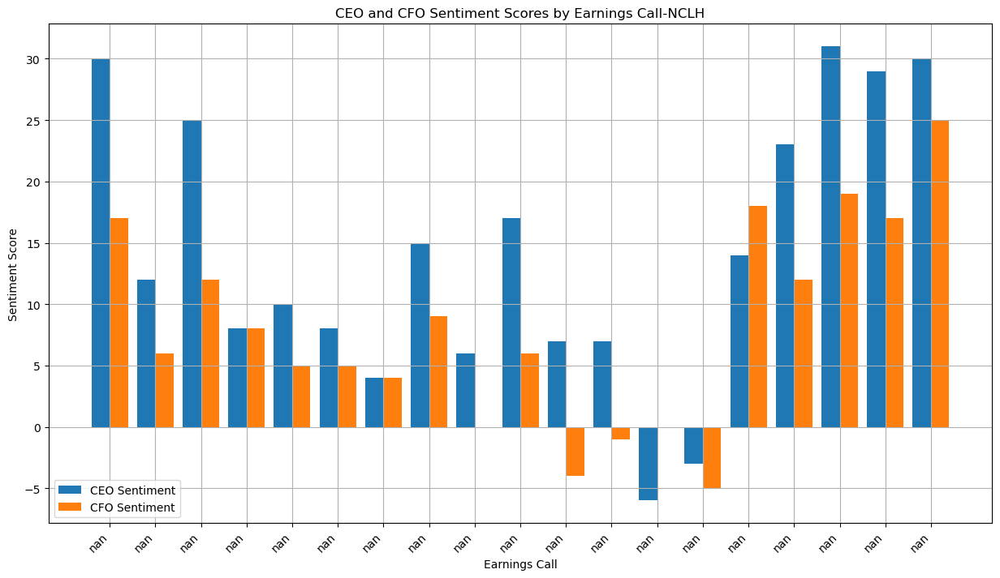

In [27]:
# Extracting relevant part from the 'Title'
df_lm_nclh['Earnings Call'] = df_lm_nclh['Title'].str.extract(r'\(RCL\) (.*?) Earnings')

plt.figure(figsize=(15, 8))  # Adjust the figure size as needed

# Plotting bar chart
x = range(len(df_lm_nclh))
plt.bar([a - 0.2 for a in x], df_lm_nclh['CEO Sentiment Score'], width=0.4, label='CEO Sentiment', align='center')
plt.bar([a + 0.2 for a in x], df_lm_nclh['CFO Sentiment Score'], width=0.4, label='CFO Sentiment', align='center')

# Formatting the plot
plt.xlabel('Earnings Call')
plt.ylabel('Sentiment Score')
plt.title('CEO and CFO Sentiment Scores by Earnings Call-NCLH')
plt.xticks(x, df_lm_nclh['Earnings Call'], rotation=45, ha='right')  # Use the extracted part for x-axis labels
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

14th March 2020: CDC Issues No Sail Order
15th March 2022: CDC Drops cruise health travel warning notice 

source: https://cruiseindustrynews.com/cruise-news/2022/08/cdc-cruise-ship-timeline-from-no-sail-to-the-end-of-covid-19-program/

## TF - IDF

In [62]:
#here i am creating a custom function to calculate TF-IDF for a company (either CEO or CFO), 
#then aggreagtes the most common words across all transcripts and plots them on a wordcloud

def calculate_tf_idf_plot(df, text_column, company_name, role):
    # Initialize the TF-IDF Vectorizer
    vectorizer = TfidfVectorizer()
    
    # Fit and transform the text to get TF-IDF features
    vectors = vectorizer.fit_transform(df[text_column])
    feature_names = vectorizer.get_feature_names_out()
    dense = vectors.todense()
    denselist = dense.tolist()
    
    # Create a DataFrame from the dense list
    tfidf_df = pd.DataFrame(denselist, columns=feature_names)
    
    # Aggregate TF-IDF scores for each term across all documents
    term_frequencies = tfidf_df.sum(axis=0)
    
    # Create a word cloud from the aggregated frequencies
    wordcloud = WordCloud(background_color='white', max_words=100, contour_width=3, contour_color='steelblue')
    
    # Generate the word cloud
    wordcloud.generate_from_frequencies(term_frequencies)
    
    # Display the word cloud using matplotlib
    plt.figure(figsize=(10, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')  # Hide the axis
    
    # Set the title with company name and role
    plt.title(f'{company_name} {role} Word Cloud', fontsize=20)
    plt.show()
  

#### TF-IDF for Norweigian Cruise Lines

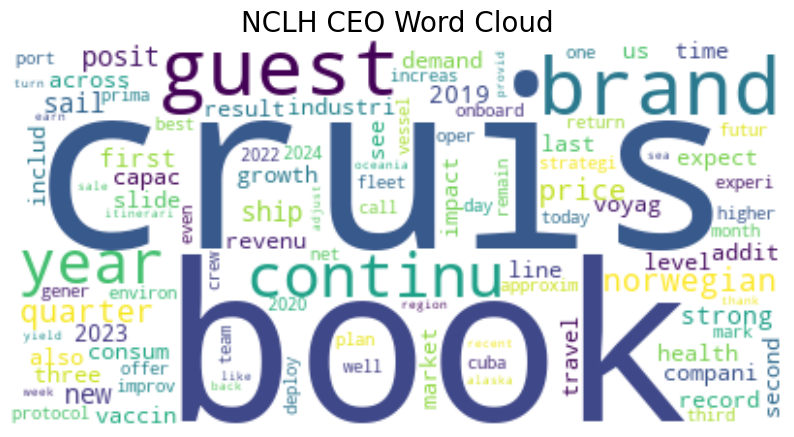

In [63]:
#generate TF-IDF wordcloud for NCLH CEO text across all transcripts
calculate_tf_idf_plot(df_nclh, 'CEO Text Cleaned', 'NCLH', 'CEO')

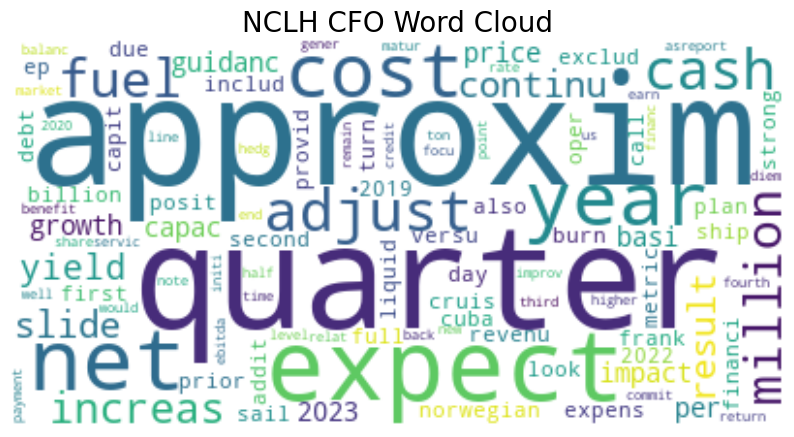

In [64]:
#generate TF-IDF wordcloud for NCLH CEO text across all transcripts
calculate_tf_idf_plot(df_nclh, 'CFO Text Cleaned', 'NCLH', 'CFO')

#### TF-IDF for Royal Carribean

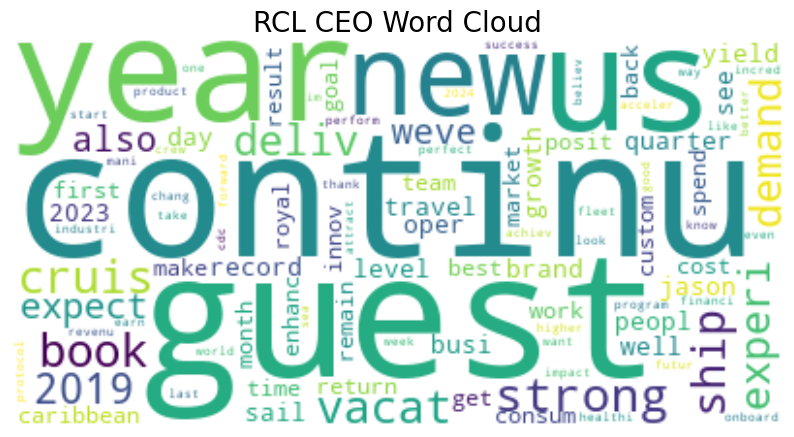

In [65]:
#generate TF-IDF wordcloud for  CEO text across all transcripts
calculate_tf_idf_plot(df_rcl, 'CEO Text Cleaned', 'RCL', 'CEO')

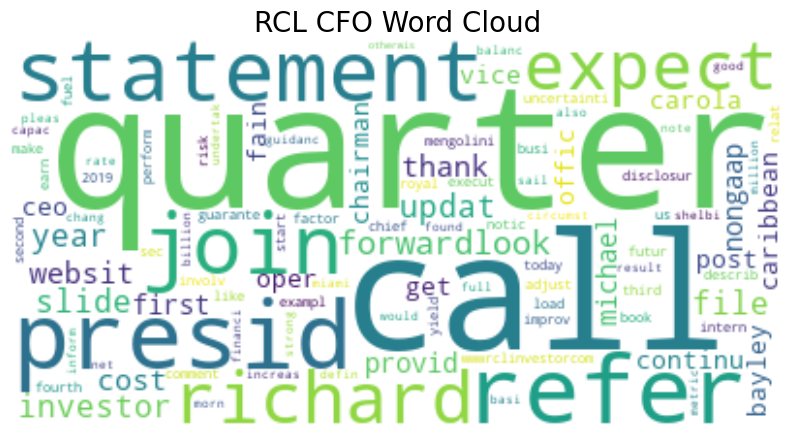

In [66]:
#generate TF-IDF wordcloud for  CEO text across all transcripts
calculate_tf_idf_plot(df_rcl, 'CFO Text Cleaned', 'RCL', 'CFO')

#### TF-IDF for Southwest Airlines

In [88]:
#clean the southwest airline text
text_analyzer = TextAnalyzer(df_luv)
text_analyzer.apply_preprocessing()

# Rename the DataFrame to df_preprocessed
df_preprocessed_luv = text_analyzer.df

# Now, df_preprocessed will have additional columns for preprocessed CEO and CFO texts
df_preprocessed_luv.head(20)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/amberwalker/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned
0,Southwest Airlines (LUV) Q4 2023 Earnings Call...,"Jan 25, 2024","Thank you, Julie, and thank you, everyone, for...","Thank you, Bob, and hello, everyone. As Bob me...",https://www.fool.com/earnings/call-transcripts...,thank juli thank everyon join call today close...,thank bob hello everyon bob mention 2023 wasnt...
1,Southwest Airlines (LUV) Q3 2023 Earnings Call...,"Oct 26, 2023","Well, thanks, Julia, and good morning, everyon...","Thank you, Bob, and hello, everyone. First, I ...",https://www.fool.com/earnings/call-transcripts...,well thank julia good morn everyon jump financ...,thank bob hello everyon first would like exten...
2,Southwest Airlines (LUV) Q2 2023 Earnings Call...,"Jul 27, 2023","Thanks Julia, and good morning, everyone. I ap...","Thank you, Bob, and hello, everyone. First, I'...",https://www.fool.com/earnings/call-transcripts...,thank julia good morn everyon appreci join us ...,thank bob hello everyon first id like extend a...
3,Southwest Airlines (LUV) Q1 2023 Earnings Call...,"Apr 27, 2023","Thank you, Ryan, and thank you, everyone, for ...","Thank you, Bob, and hello, everyone. Our first...",https://www.fool.com/earnings/call-transcripts...,thank ryan thank everyon join us morn incur fi...,thank bob hello everyon first quarter loss dis...
4,Southwest Airlines (LUV) Q4 2022 Earnings Call...,"Jan 26, 2023","All right. Thank you, Ryan, and I appreciate e...","Thank you, Andrew. And hello, everyone. I will...",https://www.fool.com/earnings/call-transcripts...,right thank ryan appreci everybodi join us mor...,thank andrew hello everyon provid quick overvi...
5,Southwest Airlines (LUV) Q3 2022 Earnings Call...,"Oct 27, 2022","All right. Well, thank you, Ryan, and I apprec...","Thank you, Bob, and thank you, Mike, my very g...",https://www.fool.com/earnings/call-transcripts...,right well thank ryan appreci everybodi join u...,thank bob thank mike good friend 3 decad incre...
6,Southwest Airlines (LUV) Q2 2022 Earnings Call...,"Jul 28, 2022","Well, thank you, Ryan, and I appreciate everyb...","Thank you, Bob, and hello, everyone. First, I'...",https://www.fool.com/earnings/call-transcripts...,well thank ryan appreci everybodi join us morn...,thank bob hello everyon first id also like tha...
7,Southwest Airlines (LUV) Q1 2022 Earnings Call...,"Apr 28, 2022","All right. Well, thank you, Ryan. Hello, every...","Thank you, Bob, and hello, everyone. First, I'...",https://www.fool.com/earnings/call-transcripts...,right well thank ryan hello everybodi thank jo...,thank bob hello everyon first id also like tha...
8,Southwest Airlines (LUV) Q4 2021 Earnings Call...,"Jan 27, 2022","Thank you, Ryan. And good morning, everybody. ...","Right. Hello, everyone, and thank you, Bob. I'...",https://www.fool.com/earnings/call-transcripts...,thank ryan good morn everybodi thank join us s...,right hello everyon thank bob ive work bob lon...
9,Southwest Airlines (LUV) Q3 2021 Earnings Call...,"Oct 21, 2021","Ryan, thank you very much, and good morning, e...","Thank you, Bob, and hello, everyone. I'll prov...",https://www.fool.com/earnings/call-transcripts...,ryan thank much good morn everybodi welcom thi...,thank bob hello everyon ill provid quick overv...


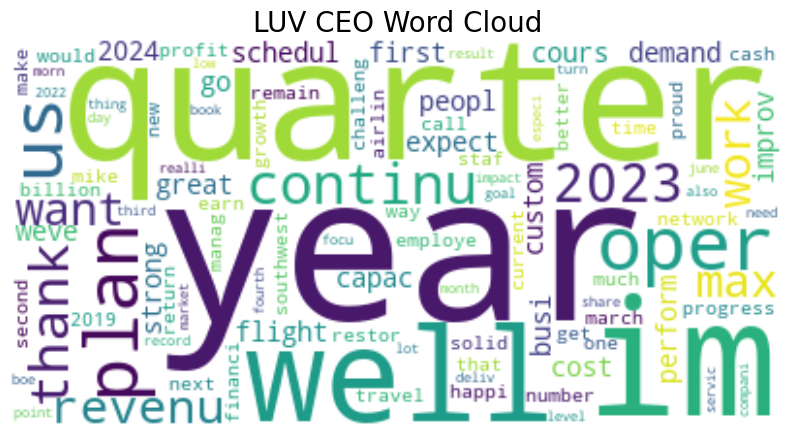

In [68]:
#generate TF-IDF wordcloud for  CEO text across all transcripts
calculate_tf_idf_plot(df_luv, 'CEO Text Cleaned', 'LUV', 'CEO')

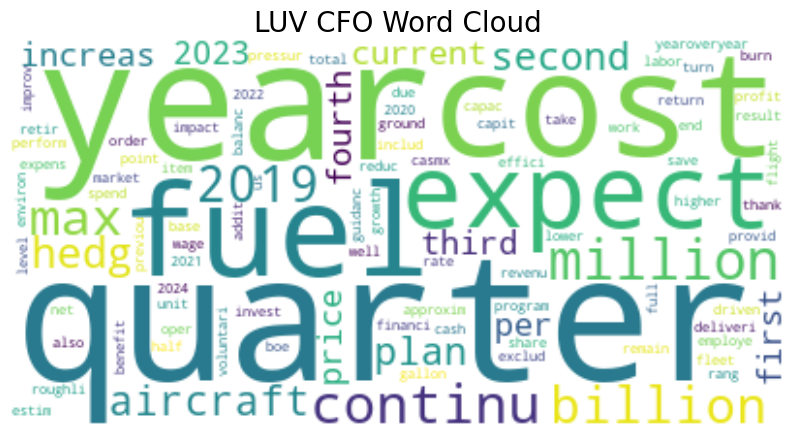

In [69]:
#generate TF-IDF wordcloud for  CFO text across all transcripts
calculate_tf_idf_plot(df_luv, 'CFO Text Cleaned', 'LUV', 'CFO')

#### TF-IDF for Delta Airlines

In [74]:
df_dal.head()

,Title,Date,CEO Text,CFO Text,Link
0,Delta Air Lines (DAL) Q4 2023 Earnings Call Tr...,"Jan 12, 2024","Well, thank you, Julie, and good morning, ever...","Thank you, Glen, and good morning to everyone....",https://www.fool.com/earnings/call-transcripts...
1,Delta Air Lines (DAL) Q3 2023 Earnings Call Tr...,"Oct 12, 2023","Well, thank you, Julie, and good morning, ever...","Thank you, Glen, and good morning to everyone....",https://www.fool.com/earnings/call-transcripts...
2,Delta Air Lines (DAL) Q2 2023 Earnings Call Tr...,"Jul 13, 2023","Thanks, Julie. Good morning, everyone. We appr...","Great. Thank you, Glen, and good morning to ev...",https://www.fool.com/earnings/call-transcripts...
3,Delta Air Lines (DAL) Q4 2022 Earnings Call Tr...,"Jan 13, 2023","Thank you, Julie. Good morning, everyone. We a...","Great. Thank you, Glen. In 2022, we made signi...",https://www.fool.com/earnings/call-transcripts...
4,Delta Air Lines (DAL) Q3 2022 Earnings Call Tr...,"Oct 13, 2022","Well, thank you, Julie, and good morning, ever...","Thank you, Glen, and good morning to everyone....",https://www.fool.com/earnings/call-transcripts...


In [75]:
#clean the text for delta airlines
text_analyzer = TextAnalyzer(df_dal)
text_analyzer.apply_preprocessing()

# Rename the DataFrame to df_preprocessed
df_preprocessed_dal = text_analyzer.df

# Now, df_preprocessed will have additional columns for preprocessed CEO and CFO texts
df_preprocessed_dal.head(20)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/amberwalker/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Title,Date,CEO Text,CFO Text,Link,CEO Text Cleaned,CFO Text Cleaned
0,Delta Air Lines (DAL) Q4 2023 Earnings Call Tr...,"Jan 12, 2024","Well, thank you, Julie, and good morning, ever...","Thank you, Glen, and good morning to everyone....",https://www.fool.com/earnings/call-transcripts...,well thank juli good morn everyon appreci join...,thank glen good morn everyon 2023 anoth meanin...
1,Delta Air Lines (DAL) Q3 2023 Earnings Call Tr...,"Oct 12, 2023","Well, thank you, Julie, and good morning, ever...","Thank you, Glen, and good morning to everyone....",https://www.fool.com/earnings/call-transcripts...,well thank juli good morn everyon appreci join...,thank glen good morn everyon septemb quarter d...
2,Delta Air Lines (DAL) Q2 2023 Earnings Call Tr...,"Jul 13, 2023","Thanks, Julie. Good morning, everyone. We appr...","Great. Thank you, Glen, and good morning to ev...",https://www.fool.com/earnings/call-transcripts...,thank juli good morn everyon appreci join us t...,great thank glen good morn everyon june quarte...
3,Delta Air Lines (DAL) Q4 2022 Earnings Call Tr...,"Jan 13, 2023","Thank you, Julie. Good morning, everyone. We a...","Great. Thank you, Glen. In 2022, we made signi...",https://www.fool.com/earnings/call-transcripts...,thank juli good morn everyon appreci join us t...,great thank glen 2022 made signific progress r...
4,Delta Air Lines (DAL) Q3 2022 Earnings Call Tr...,"Oct 13, 2022","Well, thank you, Julie, and good morning, ever...","Thank you, Glen, and good morning to everyone....",https://www.fool.com/earnings/call-transcripts...,well thank juli good morn everyon appreci join...,thank glen good morn everyon septemb quarter d...
5,Delta Air Lines (DAL) Q2 2022 Earnings Call Tr...,"Jul 13, 2022","Well, thank you, Julie, and good morning. We a...","Thank you, Glen, and good morning to everyone....",https://www.fool.com/earnings/call-transcripts...,well thank juli good morn appreci everyon join...,thank glen good morn everyon june quarter deli...
6,Delta Air Lines (DAL) Q1 2022 Earnings Call Tr...,"Apr 13, 2022","Well, thank you, Julie. Good morning, everyone...","Thank you, Glen, and good morning to everyone....",https://www.fool.com/earnings/call-transcripts...,well thank juli good morn everyon appreci join...,thank glen good morn everyon start highlight m...
7,Delta Air Lines (DAL) Q4 2021 Earnings Call Tr...,"Jan 13, 2022","Well, thank you, Julie. Good morning, everyone...","Great. Glen, thank you. The Delta team execute...",https://www.fool.com/earnings/call-transcripts...,well thank juli good morn everyon realli appre...,great glen thank delta team execut well 2021 e...
8,Delta Air Lines (DAL) Q3 2021 Earnings Call Tr...,"Oct 13, 2021","Well, thank you, Julie, and good morning, ever...","Great. Thank you, Glen. The team's world-class...",https://www.fool.com/earnings/call-transcripts...,well thank juli good morn everyon appreci join...,great thank glen team worldclass capabl contin...
9,Delta Air Lines (DAL) Q2 2021 Earnings Call Tr...,"Jul 14, 2021","Well, thank you, Julie. Good morning, everyone...","Thank you, Ed and Glen, for the warm welcome. ...",https://www.fool.com/earnings/call-transcripts...,well thank juli good morn everyon appreci join...,thank ed glen warm welcom im certainli pleas b...


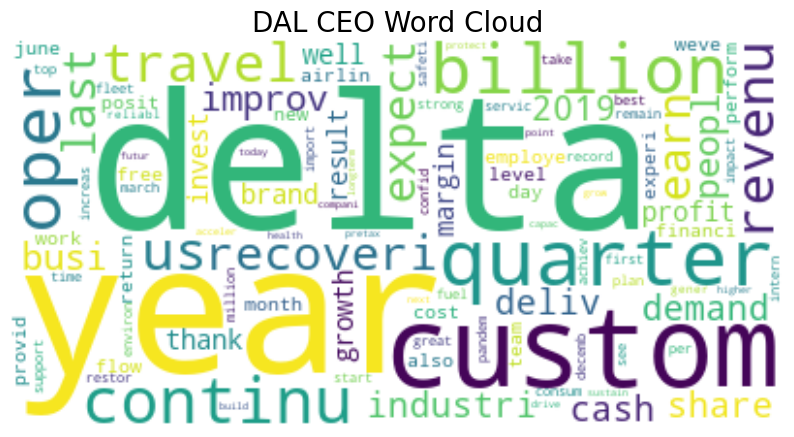

In [76]:
#generate TF-IDF wordcloud for  CEO text across all transcripts
calculate_tf_idf_plot(df_dal, 'CEO Text Cleaned', 'DAL', 'CEO')

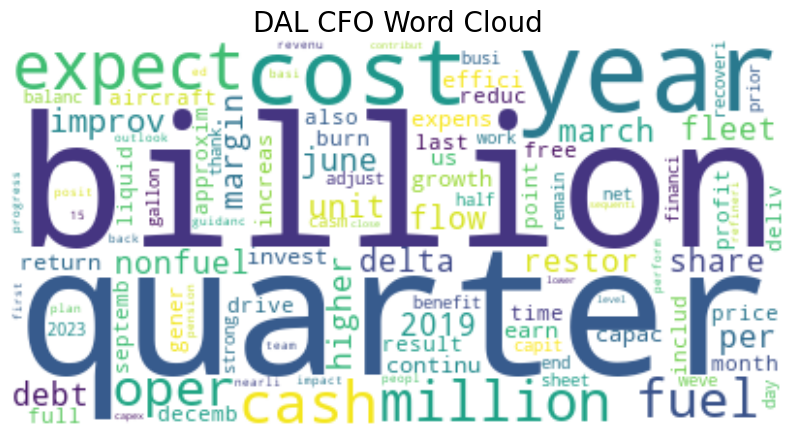

In [77]:
#generate TF-IDF wordcloud for  CFO text across all transcripts
calculate_tf_idf_plot(df_dal, 'CFO Text Cleaned', 'DAL', 'CFO')

#### Analysis of TF-IDF for CFOs across all companies

Step 1: Combine CEO and CFO Texts

In [90]:
# Concatenate all CFO texts into one series
all_cfo_texts = pd.concat([
    df_nclh['CFO Text Cleaned'],
    df_rcl['CFO Text Cleaned'],
    df_luv['CFO Text Cleaned'],
    df_dal['CFO Text Cleaned']
], ignore_index=True)

# Concatenate all CEO texts into one series
all_ceo_texts = pd.concat([
    df_nclh['CEO Text Cleaned'],
    df_rcl['CEO Text Cleaned'],
    df_luv['CEO Text Cleaned'],
    df_dal['CEO Text Cleaned']
], ignore_index=True)

Step 2: Define a Function to Calculate TF-IDF and Generate a Word Cloud

In [91]:
def calculate_tf_idf_plot_for_role(all_texts, title):
    """
    Generates a word cloud from a collection of texts using TF-IDF scores to highlight the most significant terms.

    Parameters:
    - all_texts: A Pandas Series or list containing all the texts to be analyzed.
    - title: A string for the title of the word cloud plot.
    """
    # Initialize the TF-IDF Vectorizer
    vectorizer = TfidfVectorizer()
    
    # Fit and transform the text to get TF-IDF features
    vectors = vectorizer.fit_transform(all_texts)
    feature_names = vectorizer.get_feature_names_out()
    dense = vectors.todense()
    denselist = dense.tolist()
    
    # Create a DataFrame from the dense list
    tfidf_df = pd.DataFrame(denselist, columns=feature_names)
    
    # Aggregate TF-IDF scores for each term across all documents
    term_frequencies = tfidf_df.sum(axis=0)
    
    # Create a word cloud from the aggregated frequencies
    wordcloud = WordCloud(background_color='white', max_words=100, contour_width=3, contour_color='steelblue')
    
    # Generate the word cloud
    wordcloud.generate_from_frequencies(term_frequencies)
    
    # Display the word cloud using matplotlib
    plt.figure(figsize=(10, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')  # Hide the axis
    plt.title(title, fontsize=20)
    plt.show()


Now we can call the function for CFO and CEO

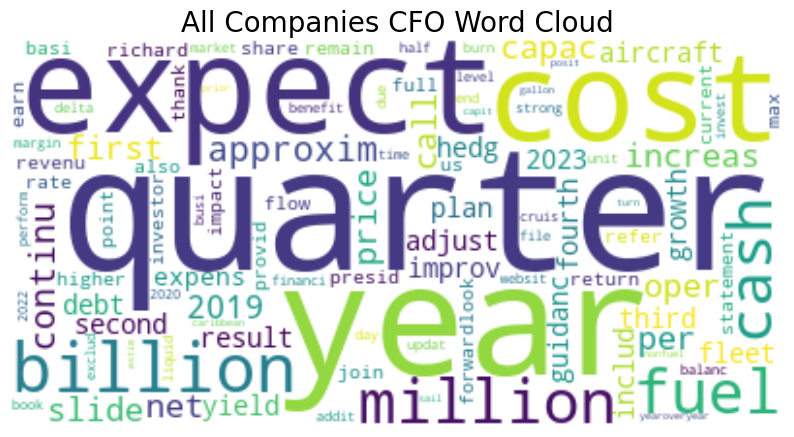

In [93]:
#let's look at the TF-IDF wordcloud for all CFO text across all companies
calculate_tf_idf_plot_for_role(all_cfo_texts, 'All Companies CFO Word Cloud')

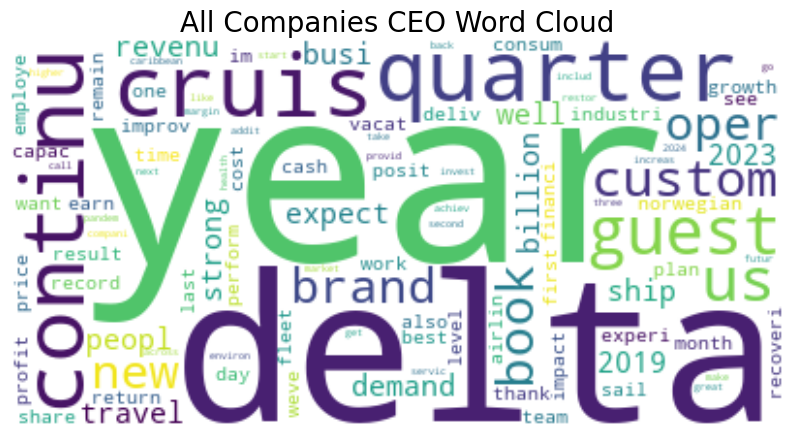

In [94]:
#let's look at the TF-IDF wordcloud for all CFO text across all companies
calculate_tf_idf_plot_for_role(all_ceo_texts, 'All Companies CEO Word Cloud')

#### Analysis of TF-IDF for each industry

In [95]:
# Concatenate all CFO texts into one series
cruise_cfo_texts = pd.concat([
    df_nclh['CFO Text Cleaned'],
    df_rcl['CFO Text Cleaned']
], ignore_index=True)

# Concatenate all CEO texts into one series
cruise_ceo_texts = pd.concat([
    df_nclh['CEO Text Cleaned'],
    df_rcl['CEO Text Cleaned']
], ignore_index=True)

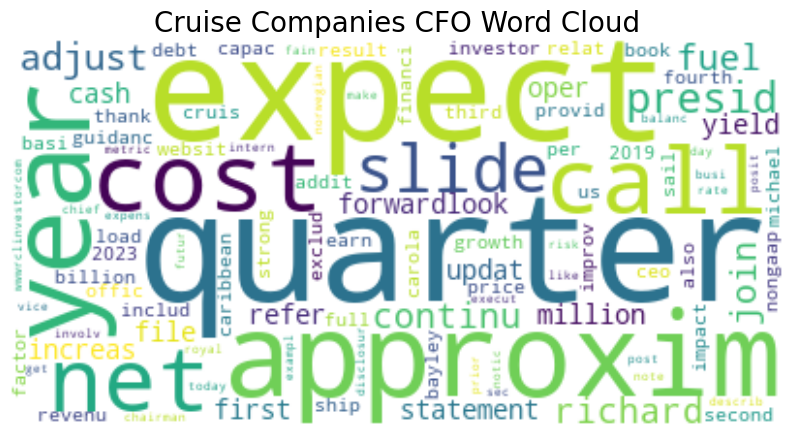

In [96]:
#let's look at the TF-IDF wordcloud for all CFO text across all companies
calculate_tf_idf_plot_for_role(cruise_cfo_texts, 'Cruise Companies CFO Word Cloud')

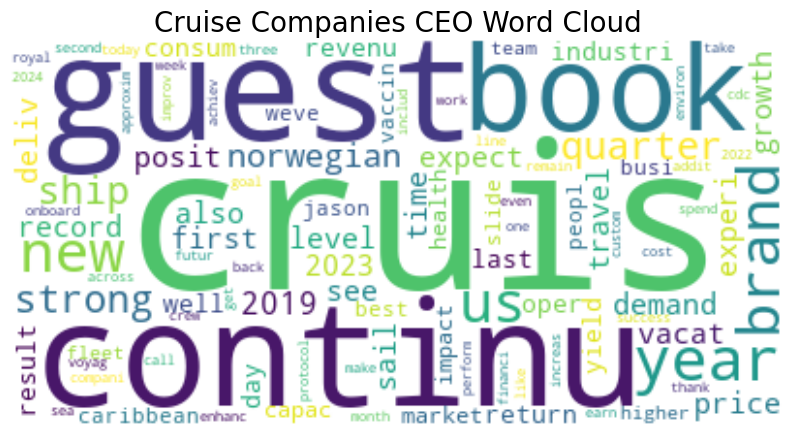

In [97]:
#let's look at the TF-IDF wordcloud for all CFO text across all companies
calculate_tf_idf_plot_for_role(cruise_ceo_texts, 'Cruise Companies CEO Word Cloud')

Now we look at the Airlines

In [99]:
# Concatenate all CFO texts into one series
airline_cfo_texts = pd.concat([
    df_luv['CFO Text Cleaned'],
    df_dal['CFO Text Cleaned']
], ignore_index=True)

# Concatenate all CEO texts into one series
airline_ceo_texts = pd.concat([
    df_luv['CEO Text Cleaned'],
    df_dal['CEO Text Cleaned']
], ignore_index=True)

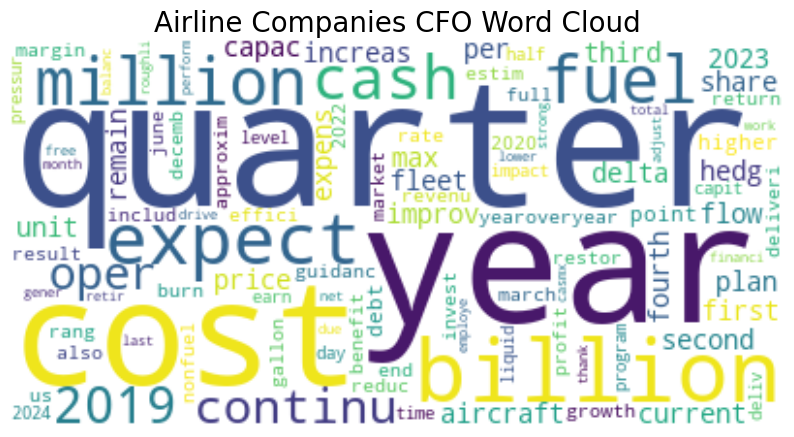

In [100]:
#let's look at the TF-IDF wordcloud for all CFO text across airline companies
calculate_tf_idf_plot_for_role(airline_cfo_texts, 'Airline Companies CFO Word Cloud')

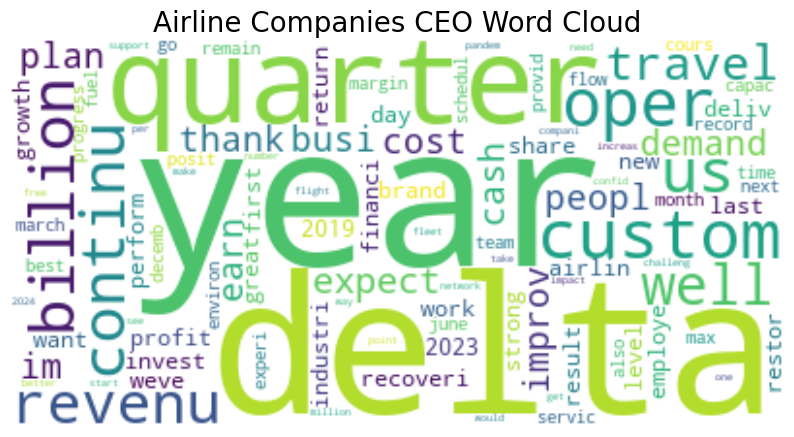

In [101]:
#let's look at the TF-IDF wordcloud for all CEO text across airline companies
calculate_tf_idf_plot_for_role(airline_ceo_texts, 'Airline Companies CEO Word Cloud')

# COVID Timelines

--------

In [28]:
from datetime import datetime
import pandas as pd

# Defining the date ranges
pre_covid = (datetime(2018, 6, 1), datetime(2020, 3, 14))
covid_lockdowns = (datetime(2020, 3, 14), datetime(2022, 3, 15))
post_covid = (datetime(2022, 3, 15), datetime.now())

# Creating a DataFrame to hold these periods
covid_periods_df = pd.DataFrame({
    'Period': ['Pre-COVID', 'COVID Lockdowns', 'Post-COVID'],
    'Start Date': [pre_covid[0], covid_lockdowns[0], post_covid[0]],
    'End Date': [pre_covid[1], covid_lockdowns[1], post_covid[1]]
})

covid_periods_df



,Period,Start Date,End Date
0,Pre-COVID,2018-06-01,2020-03-14 00:00:00.000000
1,COVID Lockdowns,2020-03-14,2022-03-15 00:00:00.000000
2,Post-COVID,2022-03-15,2024-03-15 13:54:00.482427


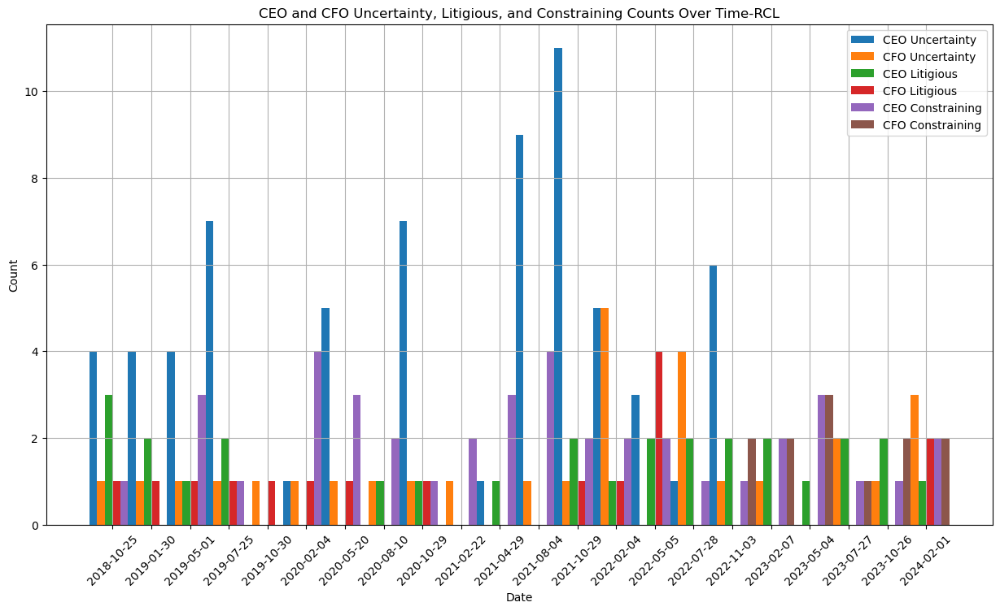

In [29]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming your DataFrame is named df_lm and is already loaded with necessary data

# Convert 'Date' to datetime for sorting
df_lm_rcl['Date'] = pd.to_datetime(df_lm_rcl['Date'], errors='coerce')
df_lm_rcl.dropna(subset=['Date'], inplace=True)
df_lm_rcl.sort_values('Date', inplace=True)

plt.figure(figsize=(15, 8))  # Adjust the figure size as needed

# Plotting the grouped bar chart
x = range(len(df_lm_rcl))
bar_width = 0.2  # Width of the bars

# Plotting each set of data
plt.bar(x, df_lm_rcl['CEO Uncertainty Count'], width=bar_width, label='CEO Uncertainty', align='center')
plt.bar([a + bar_width for a in x], df_lm_rcl['CFO Uncertainty Count'], width=bar_width, label='CFO Uncertainty', align='center')

plt.bar([a + bar_width*2 for a in x], df_lm_rcl['CEO Litigious Count'], width=bar_width, label='CEO Litigious', align='center')
plt.bar([a + bar_width*3 for a in x], df_lm_rcl['CFO Litigious Count'], width=bar_width, label='CFO Litigious', align='center')

plt.bar([a + bar_width*4 for a in x], df_lm_rcl['CEO Constraining Count'], width=bar_width, label='CEO Constraining', align='center')
plt.bar([a + bar_width*5 for a in x], df_lm_rcl['CFO Constraining Count'], width=bar_width, label='CFO Constraining', align='center')

# Formatting the plot
plt.xlabel('Date')
plt.ylabel('Count')
plt.title('CEO and CFO Uncertainty, Litigious, and Constraining Counts Over Time-RCL')
plt.xticks([a + bar_width*2.5 for a in x], df_lm_rcl['Date'].dt.strftime('%Y-%m-%d'), rotation=45)  # Setting x-ticks to the middle of the group of bars
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


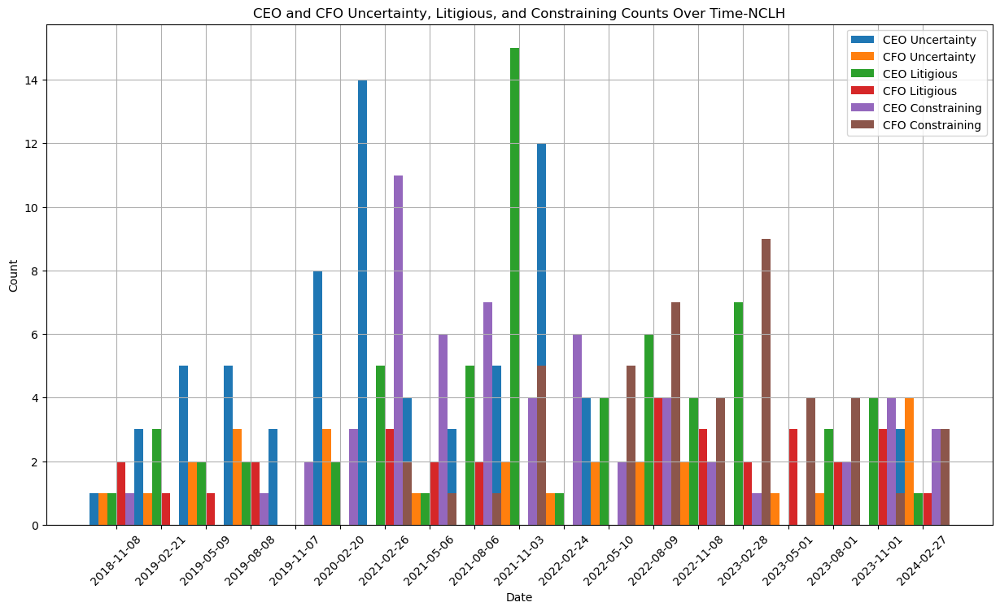

In [30]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming your DataFrame is named df_lm and is already loaded with necessary data

# Convert 'Date' to datetime for sorting
df_lm_nclh['Date'] = pd.to_datetime(df_lm_nclh['Date'], errors='coerce')
df_lm_nclh.dropna(subset=['Date'], inplace=True)
df_lm_nclh.sort_values('Date', inplace=True)

plt.figure(figsize=(15, 8))  # Adjust the figure size as needed

# Plotting the grouped bar chart
x = range(len(df_lm_nclh))
bar_width = 0.2  # Width of the bars

# Plotting each set of data
plt.bar(x, df_lm_nclh['CEO Uncertainty Count'], width=bar_width, label='CEO Uncertainty', align='center')
plt.bar([a + bar_width for a in x], df_lm_nclh['CFO Uncertainty Count'], width=bar_width, label='CFO Uncertainty', align='center')

plt.bar([a + bar_width*2 for a in x], df_lm_nclh['CEO Litigious Count'], width=bar_width, label='CEO Litigious', align='center')
plt.bar([a + bar_width*3 for a in x], df_lm_nclh['CFO Litigious Count'], width=bar_width, label='CFO Litigious', align='center')

plt.bar([a + bar_width*4 for a in x], df_lm_nclh['CEO Constraining Count'], width=bar_width, label='CEO Constraining', align='center')
plt.bar([a + bar_width*5 for a in x], df_lm_nclh['CFO Constraining Count'], width=bar_width, label='CFO Constraining', align='center')

# Formatting the plot
plt.xlabel('Date')
plt.ylabel('Count')
plt.title('CEO and CFO Uncertainty, Litigious, and Constraining Counts Over Time-NCLH')
plt.xticks([a + bar_width*2.5 for a in x], df_lm_nclh['Date'].dt.strftime('%Y-%m-%d'), rotation=45)  # Setting x-ticks to the middle of the group of bars
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


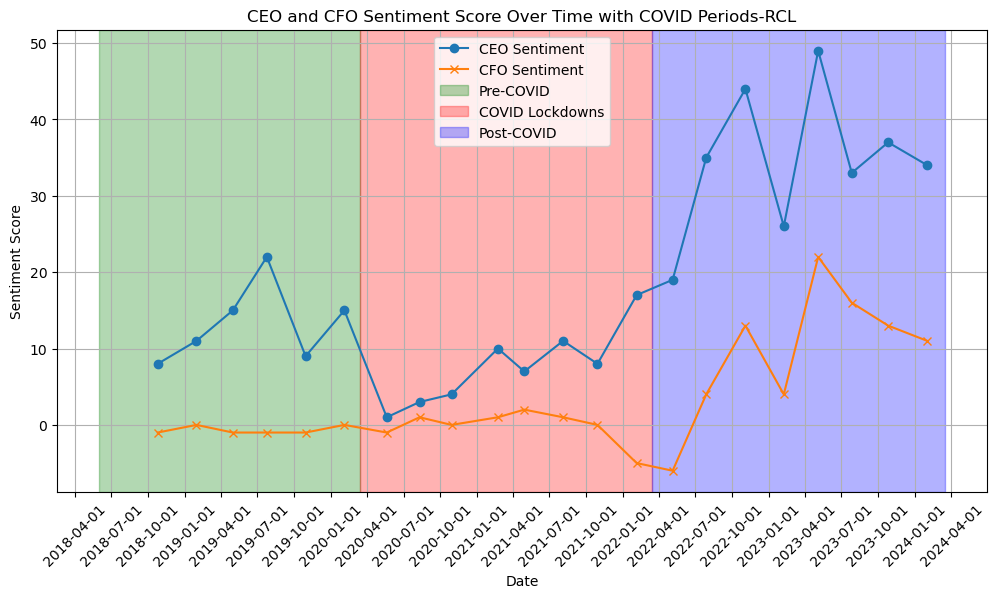

In [31]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Assuming df_lm is already loaded

# Convert 'Date' to datetime and sort the DataFrame by 'Date'
df_lm_rcl['Date'] = pd.to_datetime(df_lm_rcl['Date'], errors='coerce')
df_lm_rcl.dropna(subset=['Date'], inplace=True)
df_lm_rcl.sort_values('Date', inplace=True)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(df_lm_rcl['Date'], df_lm_rcl['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o')
plt.plot(df_lm_rcl['Date'], df_lm_rcl['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x')

# Adding background color for different periods using data from covid_periods_df
for index, row in covid_periods_df.iterrows():
    plt.axvspan(row['Start Date'], row['End Date'], color=['green', 'red', 'blue'][index], alpha=0.3, label=row['Period'])

# Formatting the plot
plt.xlabel('Date')
plt.ylabel('Sentiment Score')
plt.title('CEO and CFO Sentiment Score Over Time with COVID Periods-RCL')
plt.legend()
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=45)

# Show the plot
plt.show()


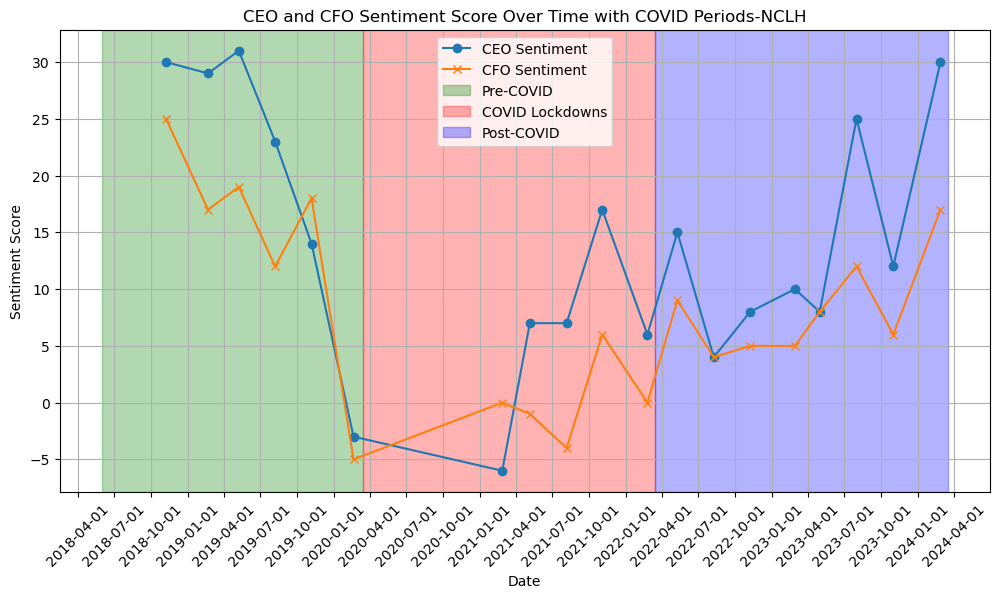

In [32]:
# Convert 'Date' to datetime and sort the DataFrame by 'Date'
df_lm_nclh['Date'] = pd.to_datetime(df_lm_nclh['Date'], errors='coerce')
df_lm_nclh.dropna(subset=['Date'], inplace=True)
df_lm_nclh.sort_values('Date', inplace=True)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(df_lm_nclh['Date'], df_lm_nclh['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o')
plt.plot(df_lm_nclh['Date'], df_lm_nclh['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x')

# Adding background color for different periods using data from covid_periods_df
for index, row in covid_periods_df.iterrows():
    plt.axvspan(row['Start Date'], row['End Date'], color=['green', 'red', 'blue'][index], alpha=0.3, label=row['Period'])

# Formatting the plot
plt.xlabel('Date')
plt.ylabel('Sentiment Score')
plt.title('CEO and CFO Sentiment Score Over Time with COVID Periods-NCLH')
plt.legend()
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=45)

# Show the plot
plt.show()


In [33]:
# Defining the date ranges
pre_covid = (datetime(2018, 6, 1), datetime(2020, 3, 14))
covid_lockdowns = (datetime(2020, 3, 14), datetime(2022, 3, 15))
post_covid = (datetime(2022, 3, 15), datetime.now())

# Printing the defined date ranges
print("Pre-COVID Period: ", pre_covid)
print("COVID Lockdowns Period: ", covid_lockdowns)
print("Post-COVID Period: ", post_covid)


Pre-COVID Period:  (datetime.datetime(2018, 6, 1, 0, 0), datetime.datetime(2020, 3, 14, 0, 0))
COVID Lockdowns Period:  (datetime.datetime(2020, 3, 14, 0, 0), datetime.datetime(2022, 3, 15, 0, 0))
Post-COVID Period:  (datetime.datetime(2022, 3, 15, 0, 0), datetime.datetime(2024, 3, 15, 13, 54, 8, 646024))


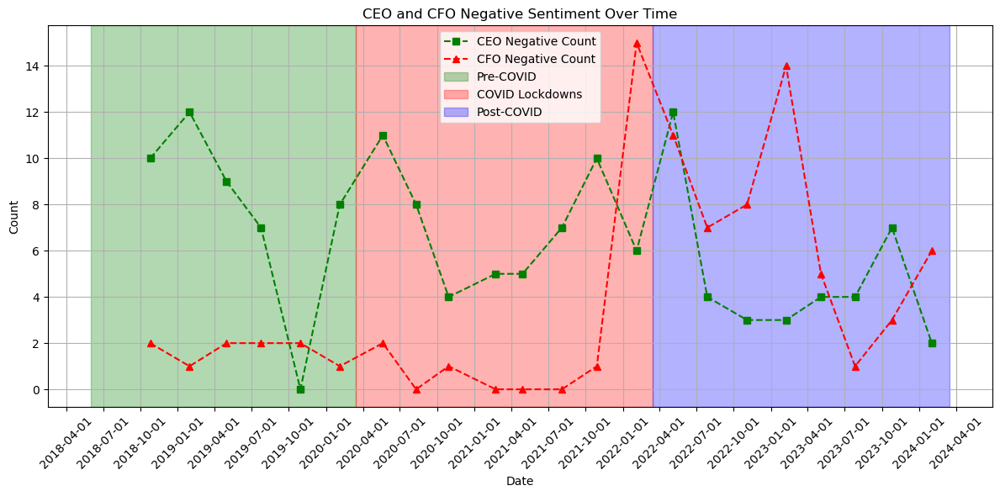

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

In [34]:
# Convert 'Date' to datetime and sort the DataFrame by 'Date'
df_lm_rcl['Date'] = pd.to_datetime(df_lm_rcl['Date'], errors='coerce')
df_lm_rcl.dropna(subset=['Date'], inplace=True)
df_lm_rcl.sort_values('Date', inplace=True)

# Plotting CEO and CFO Positive/Negative Counts
plt.figure(figsize=(12, 6))

# Plot CEO and CFO Positive/Negative Counts
plt.plot(df_lm_rcl['Date'], df_lm_rcl['CEO Negative Count'], label='CEO Negative Count', linestyle='--', marker='s', color='green')
plt.plot(df_lm_rcl['Date'], df_lm_rcl['CFO Negative Count'], label='CFO Negative Count', linestyle='--', marker='^', color='red')

# Adding background color for different periods using data from covid_periods_df
for index, row in covid_periods_df.iterrows():
    plt.axvspan(row['Start Date'], row['End Date'], color=['green', 'red', 'blue'][index], alpha=0.3, label=row['Period'])

# Formatting the plot
plt.xlabel('Date')
plt.ylabel('Count')
plt.title('CEO and CFO Negative Sentiment Over Time')
plt.legend()
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()

# Plotting CEO and CFO Uncertainty Counts
plt.figure(figsize=(12, 6))




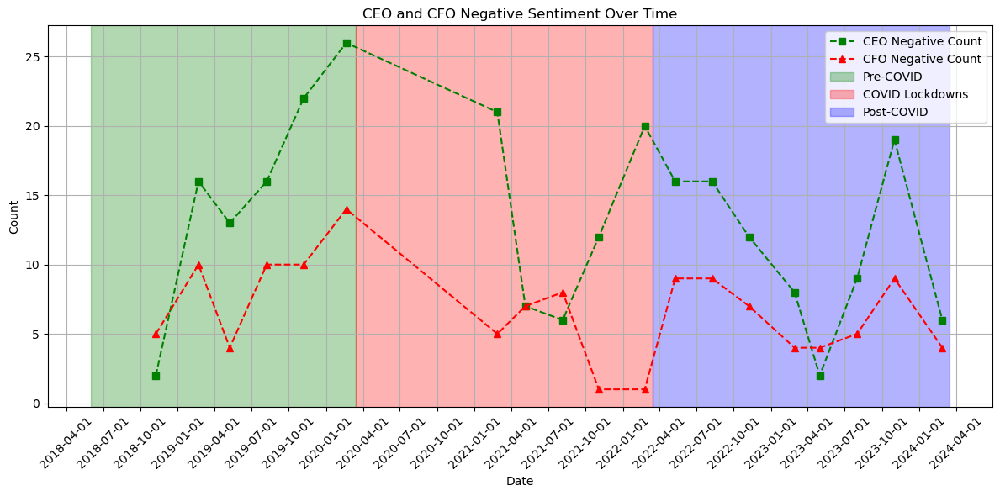

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

In [35]:
# Convert 'Date' to datetime and sort the DataFrame by 'Date'
df_lm_nclh['Date'] = pd.to_datetime(df_lm_nclh['Date'], errors='coerce')
df_lm_nclh.dropna(subset=['Date'], inplace=True)
df_lm_nclh.sort_values('Date', inplace=True)

# Plotting CEO and CFO Positive/Negative Counts
plt.figure(figsize=(12, 6))

# Plot CEO and CFO Positive/Negative Counts
plt.plot(df_lm_nclh['Date'], df_lm_nclh['CEO Negative Count'], label='CEO Negative Count', linestyle='--', marker='s', color='green')
plt.plot(df_lm_nclh['Date'], df_lm_nclh['CFO Negative Count'], label='CFO Negative Count', linestyle='--', marker='^', color='red')

# Adding background color for different periods using data from covid_periods_df
for index, row in covid_periods_df.iterrows():
    plt.axvspan(row['Start Date'], row['End Date'], color=['green', 'red', 'blue'][index], alpha=0.3, label=row['Period'])

# Formatting the plot
plt.xlabel('Date')
plt.ylabel('Count')
plt.title('CEO and CFO Negative Sentiment Over Time')
plt.legend()
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()

# Plotting CEO and CFO Uncertainty Counts
plt.figure(figsize=(12, 6))




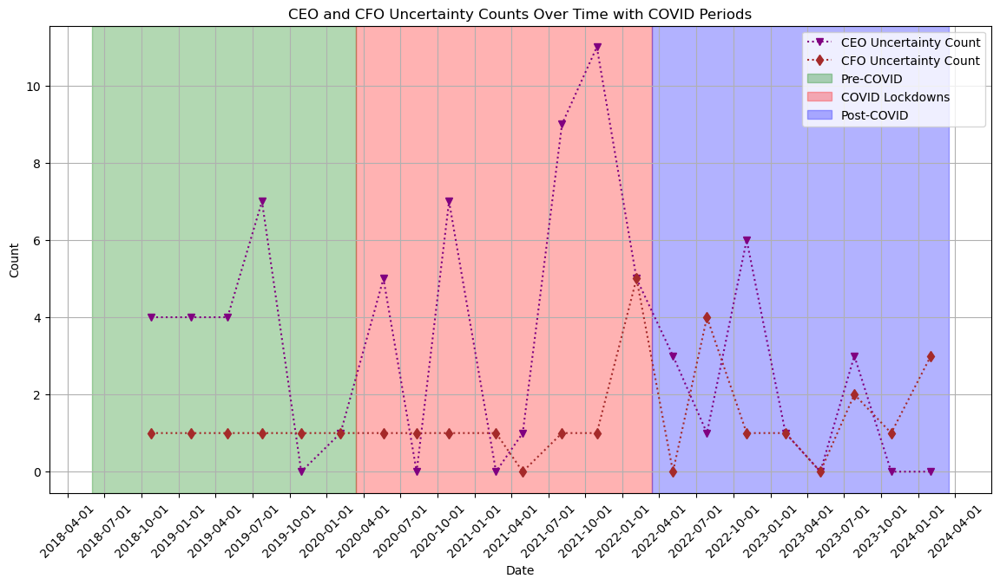

In [36]:
# Plotting CEO and CFO Uncertainty Counts
plt.figure(figsize=(14, 7))  # Set the figure size

# Plot CEO and CFO Uncertainty Counts
plt.plot(df_lm_rcl['Date'], df_lm_rcl['CEO Uncertainty Count'], label='CEO Uncertainty Count', linestyle=':', marker='v', color='purple')
plt.plot(df_lm_rcl['Date'], df_lm_rcl['CFO Uncertainty Count'], label='CFO Uncertainty Count', linestyle=':', marker='d', color='brown')

# Adding background color for different periods using data from covid_periods_df
for index, row in covid_periods_df.iterrows():
    plt.axvspan(row['Start Date'], row['End Date'], color=['green', 'red', 'blue'][index], alpha=0.3, label=row['Period'])

# Formatting the plot
plt.xlabel('Date')
plt.ylabel('Count')
plt.title('CEO and CFO Uncertainty Counts Over Time with COVID Periods')
plt.legend()
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=45)

plt.show()


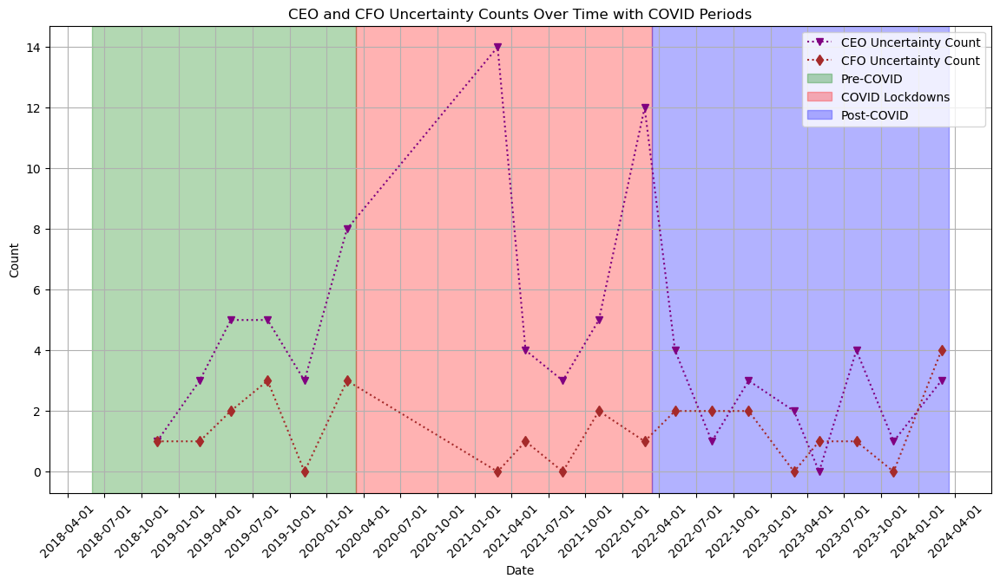

In [37]:
# Plotting CEO and CFO Uncertainty Counts
plt.figure(figsize=(14, 7))  # Set the figure size

# Plot CEO and CFO Uncertainty Counts
plt.plot(df_lm_nclh['Date'], df_lm_nclh['CEO Uncertainty Count'], label='CEO Uncertainty Count', linestyle=':', marker='v', color='purple')
plt.plot(df_lm_nclh['Date'], df_lm_nclh['CFO Uncertainty Count'], label='CFO Uncertainty Count', linestyle=':', marker='d', color='brown')

# Adding background color for different periods using data from covid_periods_df
for index, row in covid_periods_df.iterrows():
    plt.axvspan(row['Start Date'], row['End Date'], color=['green', 'red', 'blue'][index], alpha=0.3, label=row['Period'])

# Formatting the plot
plt.xlabel('Date')
plt.ylabel('Count')
plt.title('CEO and CFO Uncertainty Counts Over Time with COVID Periods')
plt.legend()
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=45)

plt.show()


# Add Financial Data to Plots
----------

In [591]:
#!pip install yfinance
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates


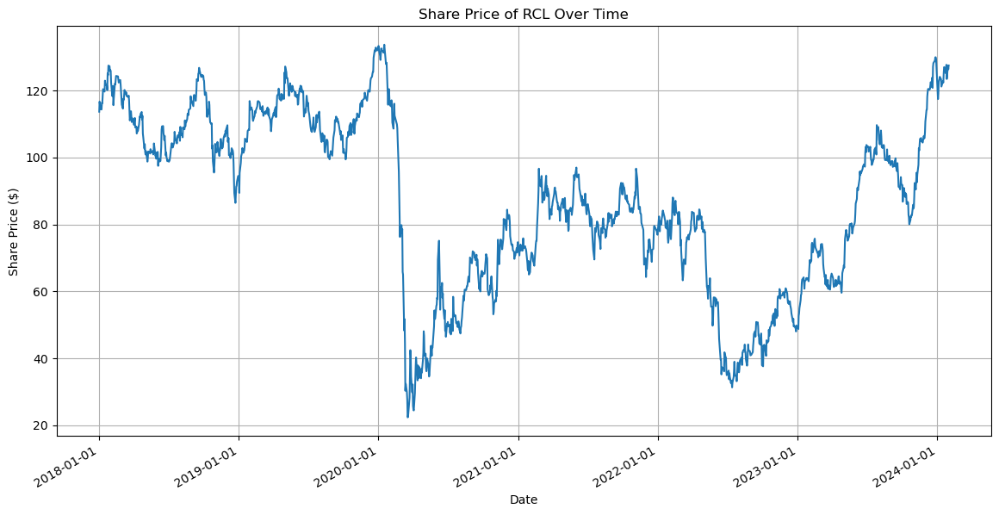

In [592]:
# Plotting the share price data
plt.figure(figsize=(14, 7))
plt.plot_date(share_price_df['Date'], share_price_df['Share Price'], linestyle='solid', marker=None)

# Formatting the plot
plt.title('Share Price of RCL Over Time')
plt.xlabel('Date')
plt.ylabel('Share Price ($)')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # Shows each year on the x-axis
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Show the plot
plt.show()


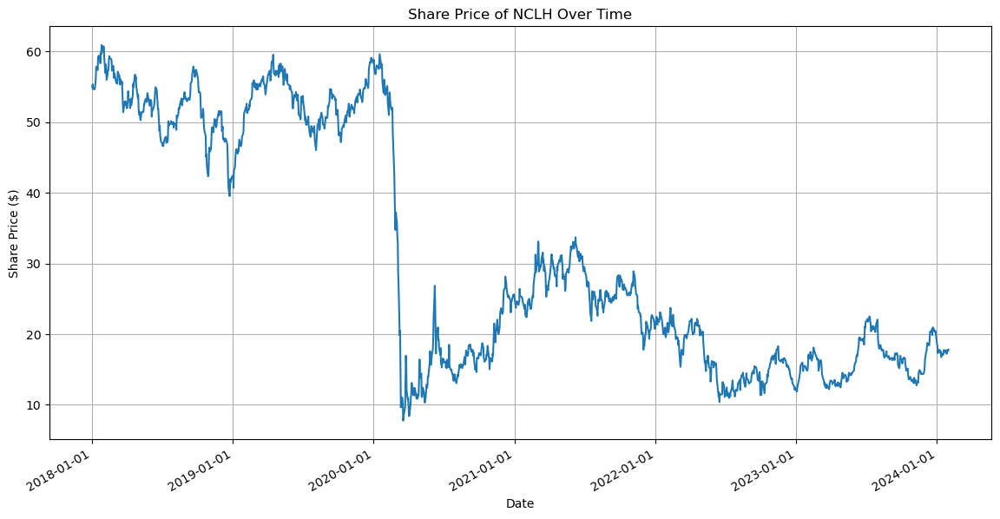

In [593]:
# Define the ticker symbol for Norwegian Cruise Line Holdings Ltd.
ticker_symbol = 'NCLH'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-01-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
nclh_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
nclh_df.reset_index(inplace=True)

# Convert 'Date' to just a date format without the time
nclh_df['Date'] = pd.to_datetime(nclh_df['Date']).dt.date

# Select only the 'Date' and 'Close' columns
nclh_share_price_df = nclh_df[['Date', 'Close']]

# Rename 'Close' to 'Share Price' for clarity
nclh_share_price_df.rename(columns={'Close': 'Share Price'}, inplace=True)

# Plotting the share price data
plt.figure(figsize=(14, 7))
plt.plot_date(nclh_share_price_df['Date'], nclh_share_price_df['Share Price'], linestyle='solid', marker=None)

# Formatting the plot
plt.title('Share Price of NCLH Over Time')
plt.xlabel('Date')
plt.ylabel('Share Price ($)')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gcf().autofmt_xdate()

# Show the plot
plt.show()


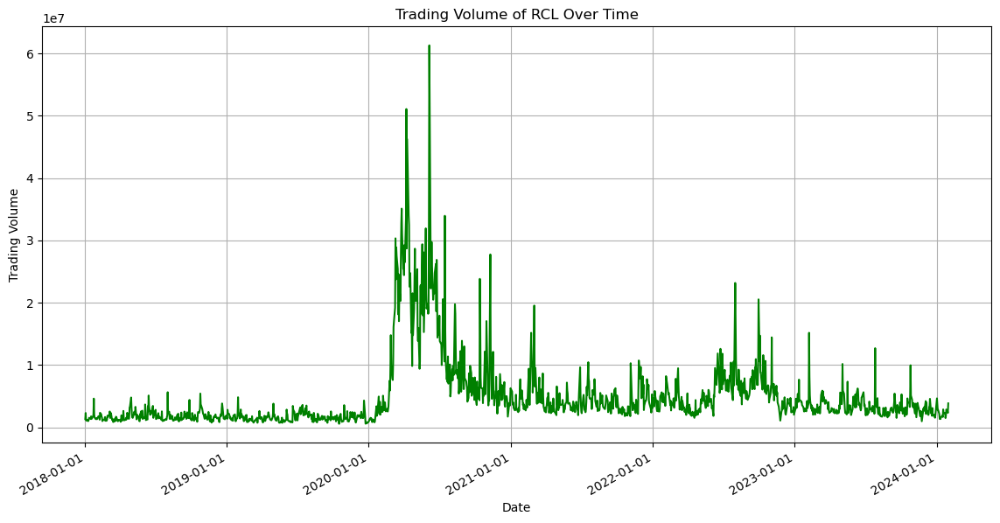

In [594]:
# Plotting the trading volume data
plt.figure(figsize=(14, 7))
plt.plot_date(volume_df['Date'], volume_df['Volume'], linestyle='solid', marker=None, color='green')  # Use 'Volume'

# Formatting the plot
plt.title('Trading Volume of RCL Over Time')
plt.xlabel('Date')
plt.ylabel('Trading Volume')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # Shows each year on the x-axis
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Show the plot
plt.show()


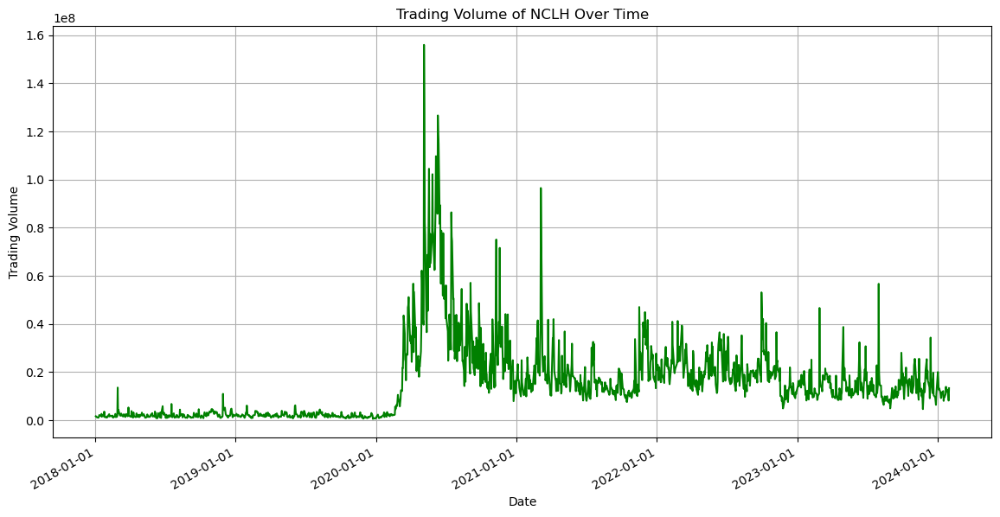

In [595]:
# Extracting the Trading Volume data
nclh_volume_df = nclh_df[['Date', 'Volume']]

# Plotting the trading volume data
plt.figure(figsize=(14, 7))
plt.plot_date(nclh_volume_df['Date'], nclh_volume_df['Volume'], linestyle='solid', marker=None, color='green')

# Formatting the plot
plt.title('Trading Volume of NCLH Over Time')
plt.xlabel('Date')
plt.ylabel('Trading Volume')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Show the plot
plt.show()


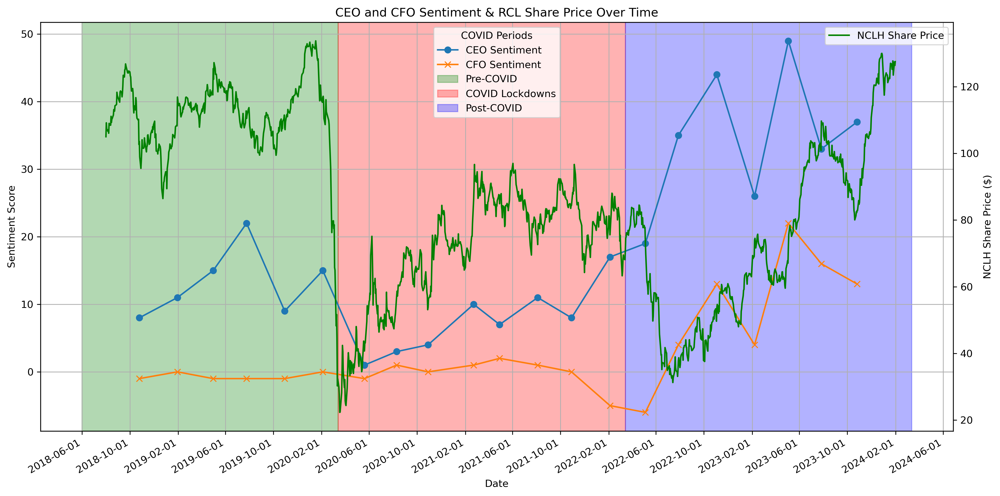

In [596]:
# Define the ticker symbol for Royal Caribbean Cruises Ltd.
ticker_symbol = 'RCL'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-08-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
ticker_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
ticker_df.reset_index(inplace=True)

# Convert 'Date' to just a date format without the time for ticker_df
ticker_df['Date'] = pd.to_datetime(ticker_df['Date']).dt.date

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7), dpi=300)

# Plot sentiment scores on the primary y-axis
ax1.plot(combined_df['Date'], combined_df['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o')
ax1.plot(combined_df['Date'], combined_df['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x')
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score')
ax1.legend(loc='upper left')

# Share Price on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ticker_df['Date'], ticker_df['Close'], label='NCLH Share Price', linestyle='-', color='green')
ax2.set_ylabel('NCLH Share Price ($)')
ax2.legend(loc='upper right')

# Formatting dates on the x-axis
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set interval to 4 months

# Rotate the tick labels diagonally
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Title and grid
ax1.set_title('CEO and CFO Sentiment & RCL Share Price Over Time')
ax1.grid(True)

# Adding COVID background colors
colors = ['green', 'red', 'blue']  # Colors for Pre-COVID, COVID Lockdowns, and Post-COVID
for i, row in covid_periods_df.iterrows():
    ax1.axvspan(row['Start Date'], row['End Date'], color=colors[i], alpha=0.3, label=row['Period'])

# Show the plot
plt.tight_layout()

# Adding legend for COVID periods
handles, labels = ax1.get_legend_handles_labels()
ax1.legend(handles=handles, labels=labels, loc='upper left')
ax1.legend(title='COVID Periods')

plt.show()


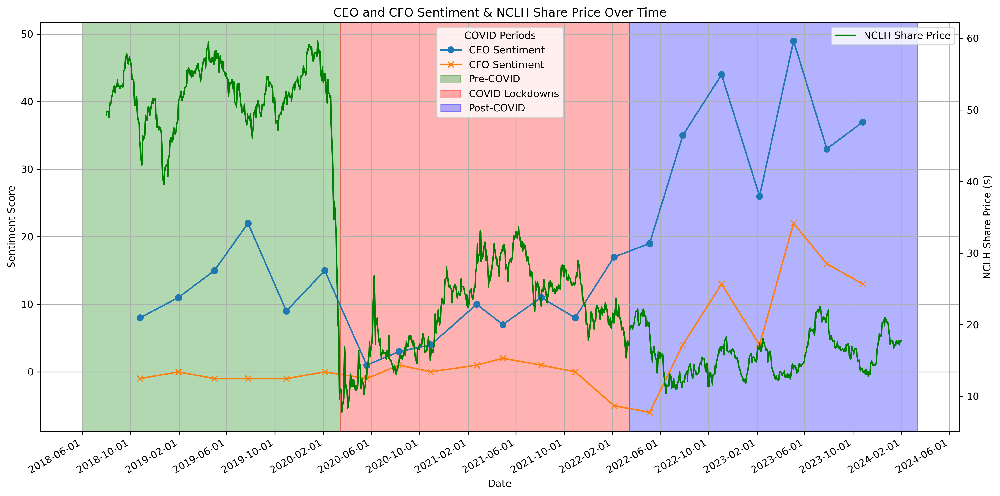

In [597]:
ticker_symbol = 'NCLH'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-08-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
ticker_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
ticker_df.reset_index(inplace=True)

# Convert 'Date' to just a date format without the time for ticker_df
ticker_df['Date'] = pd.to_datetime(ticker_df['Date']).dt.date

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7), dpi=300)

# Plot sentiment scores on the primary y-axis
ax1.plot(combined_df['Date'], combined_df['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o')
ax1.plot(combined_df['Date'], combined_df['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x')
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score')
ax1.legend(loc='upper left')

# Share Price on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ticker_df['Date'], ticker_df['Close'], label='NCLH Share Price', linestyle='-', color='green')
ax2.set_ylabel('NCLH Share Price ($)')
ax2.legend(loc='upper right')

# Formatting dates on the x-axis
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set interval to 4 months

# Rotate the tick labels diagonally
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Title and grid
ax1.set_title('CEO and CFO Sentiment & NCLH Share Price Over Time')
ax1.grid(True)

# Adding COVID background colors
colors = ['green', 'red', 'blue']  # Colors for Pre-COVID, COVID Lockdowns, and Post-COVID
for i, row in covid_periods_df.iterrows():
    ax1.axvspan(row['Start Date'], row['End Date'], color=colors[i], alpha=0.3, label=row['Period'])

# Show the plot
plt.tight_layout()

# Adding legend for COVID periods
handles, labels = ax1.get_legend_handles_labels()
ax1.legend(handles=handles, labels=labels, loc='upper left')
ax1.legend(title='COVID Periods')

plt.show()


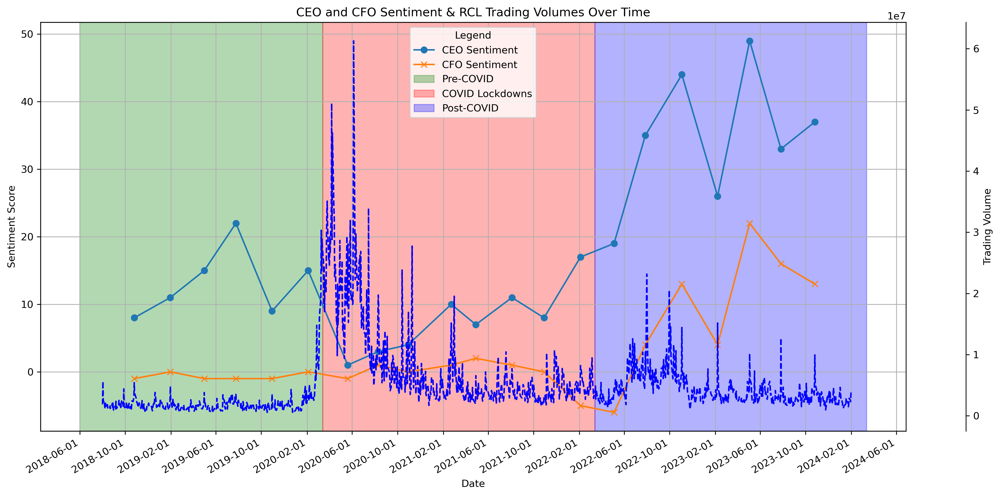

In [598]:
# Define the ticker symbol for Royal Caribbean Cruises Ltd.
ticker_symbol = 'RCL'
#ticker_symbol = 'NCLH'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-08-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
ticker_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
ticker_df.reset_index(inplace=True)

# Convert 'Date' to just a date format without the time for ticker_df
ticker_df['Date'] = pd.to_datetime(ticker_df['Date']).dt.date

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7), dpi=300)

# Plot sentiment scores on the primary y-axis
ax1.plot(combined_df['Date'], combined_df['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o')
ax1.plot(combined_df['Date'], combined_df['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x')
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score')
ax1.legend(loc='upper left')

# Trading volumes on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ticker_df['Date'], ticker_df['Volume'], label='RCL Trading Volume', linestyle='--', color='blue')
ax2.set_ylabel('Trading Volume')
ax2.spines['right'].set_position(('outward', 60))  # Adjust position of this axis

# Formatting dates on the x-axis
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set interval to 4 months

# Rotate the tick labels diagonally
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Title and grid
ax1.set_title('CEO and CFO Sentiment & RCL Trading Volumes Over Time')
ax1.grid(True)

# Adding COVID background colors
colors = ['green', 'red', 'blue']  # Colors for Pre-COVID, COVID Lockdowns, and Post-COVID
for i, row in covid_periods_df.iterrows():
    ax1.axvspan(row['Start Date'], row['End Date'], color=colors[i], alpha=0.3, label=row['Period'])

# Show the plot
plt.tight_layout()

# Adding legend for COVID periods
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(handles=handles1 + handles2, labels=labels1 + labels2, loc='upper left')
ax1.legend(title='Legend')

plt.show()


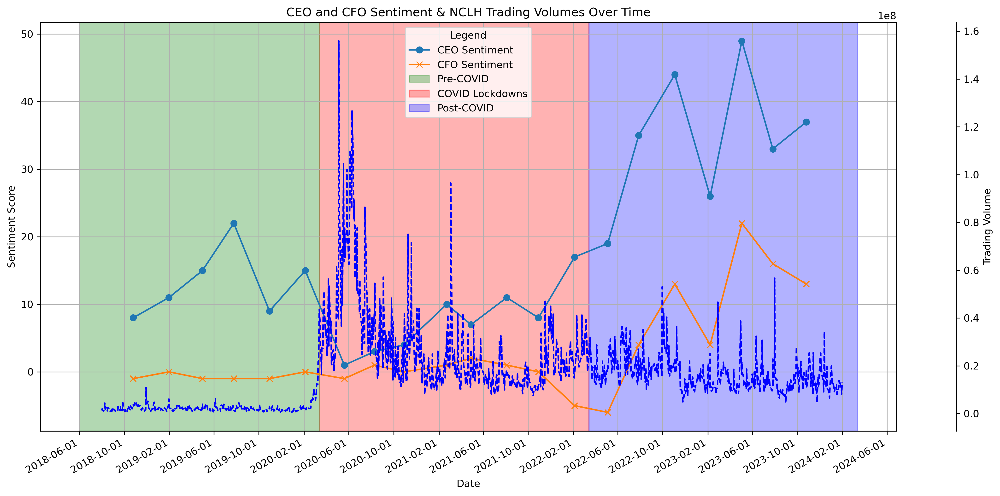

In [599]:
ticker_symbol = 'NCLH'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Define the start and end dates for the time period you're interested in.
start_date = '2018-08-01'
end_date = '2024-02-01'

# Get the historical prices for this ticker within the specified time frame
ticker_df = ticker_data.history(start=start_date, end=end_date)

# Reset the index to make 'Date' a column
ticker_df.reset_index(inplace=True)

# Convert 'Date' to just a date format without the time for ticker_df
ticker_df['Date'] = pd.to_datetime(ticker_df['Date']).dt.date

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7), dpi=300)

# Plot sentiment scores on the primary y-axis
ax1.plot(combined_df['Date'], combined_df['CEO Sentiment Score'], label='CEO Sentiment', linestyle='-', marker='o')
ax1.plot(combined_df['Date'], combined_df['CFO Sentiment Score'], label='CFO Sentiment', linestyle='-', marker='x')
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Score')
ax1.legend(loc='upper left')

# Trading volumes on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ticker_df['Date'], ticker_df['Volume'], label='RCL Trading Volume', linestyle='--', color='blue')
ax2.set_ylabel('Trading Volume')
ax2.spines['right'].set_position(('outward', 60))  # Adjust position of this axis

# Formatting dates on the x-axis
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set interval to 4 months

# Rotate the tick labels diagonally
plt.gcf().autofmt_xdate()  # Auto-rotates the dates to show them more clearly

# Title and grid
ax1.set_title('CEO and CFO Sentiment & NCLH Trading Volumes Over Time')
ax1.grid(True)

# Adding COVID background colors
colors = ['green', 'red', 'blue']  # Colors for Pre-COVID, COVID Lockdowns, and Post-COVID
for i, row in covid_periods_df.iterrows():
    ax1.axvspan(row['Start Date'], row['End Date'], color=colors[i], alpha=0.3, label=row['Period'])

# Show the plot
plt.tight_layout()

# Adding legend for COVID periods
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(handles=handles1 + handles2, labels=labels1 + labels2, loc='upper left')
ax1.legend(title='Legend')

plt.show()


# Bag of Words

In [600]:
"""
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

# Assuming df_preprocessed is your DataFrame

# Combine CEO and CFO text into a single column
df_preprocessed['Combined Text'] = df_preprocessed['CEO Text Cleaned'] + ' ' + df_preprocessed['CFO Text Cleaned']

# Tokenize the text
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df_preprocessed['Combined Text'])

# Convert the result to DataFrame
bow_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

# Add Title and Date columns to the bow_df
bow_df[['Title', 'Date']] = df_preprocessed[['Title', 'Date']]

# Display the resulting DataFrame
bow_df.head(20)
"""

"\nfrom sklearn.feature_extraction.text import CountVectorizer\nimport pandas as pd\n\n# Assuming df_preprocessed is your DataFrame\n\n# Combine CEO and CFO text into a single column\ndf_preprocessed['Combined Text'] = df_preprocessed['CEO Text Cleaned'] + ' ' + df_preprocessed['CFO Text Cleaned']\n\n# Tokenize the text\nvectorizer = CountVectorizer()\nX = vectorizer.fit_transform(df_preprocessed['Combined Text'])\n\n# Convert the result to DataFrame\nbow_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())\n\n# Add Title and Date columns to the bow_df\nbow_df[['Title', 'Date']] = df_preprocessed[['Title', 'Date']]\n\n# Display the resulting DataFrame\nbow_df.head(20)\n"

In [601]:
"""
from sklearn.decomposition import LatentDirichletAllocation
# Step 5: Perform Topic Modeling (Latent Dirichlet Allocation)
num_topics = 5  # Number of topics to identify
lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda.fit(X)

# Display the top words for each topic
print("Top words for each topic:")
for topic_idx, topic in enumerate(lda.components_):
    print(f"Topic {topic_idx}:")
    top_words_idx = topic.argsort()[:-10 - 1:-1]
    top_words = [vectorizer.get_feature_names_out()[i] for i in top_words_idx]
    print(top_words)
"""

'\nfrom sklearn.decomposition import LatentDirichletAllocation\n# Step 5: Perform Topic Modeling (Latent Dirichlet Allocation)\nnum_topics = 5  # Number of topics to identify\nlda = LatentDirichletAllocation(n_components=num_topics, random_state=42)\nlda.fit(X)\n\n# Display the top words for each topic\nprint("Top words for each topic:")\nfor topic_idx, topic in enumerate(lda.components_):\n    print(f"Topic {topic_idx}:")\n    top_words_idx = topic.argsort()[:-10 - 1:-1]\n    top_words = [vectorizer.get_feature_names_out()[i] for i in top_words_idx]\n    print(top_words)\n'

In [602]:
"""
# Step 6: Generate Word Clouds for each topic
for topic_idx, topic in enumerate(lda.components_):
    word_freq = {vectorizer.get_feature_names_out()[i]: topic[i] for i in topic.argsort()[:-30 - 1:-1]}
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Topic {topic_idx} Word Cloud')
    plt.axis('off')
    plt.show()
"""

"\n# Step 6: Generate Word Clouds for each topic\nfor topic_idx, topic in enumerate(lda.components_):\n    word_freq = {vectorizer.get_feature_names_out()[i]: topic[i] for i in topic.argsort()[:-30 - 1:-1]}\n    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)\n    plt.figure(figsize=(10, 5))\n    plt.imshow(wordcloud, interpolation='bilinear')\n    plt.title(f'Topic {topic_idx} Word Cloud')\n    plt.axis('off')\n    plt.show()\n"

In [603]:
"""
# Step 7: Assign Topic Probabilities to Documents

# Get the document-topic probabilities
doc_topic_probs = lda.transform(X)

# Create a DataFrame to store document-topic probabilities
doc_topic_df = pd.DataFrame(doc_topic_probs, columns=[f"Topic {i}" for i in range(num_topics)])

# Add Title and Date columns to the DataFrame
doc_topic_df[['Title', 'Date']] = df_preprocessed[['Title', 'Date']]

# Display the resulting DataFrame
print("Document-Topic Probabilities:")
doc_topic_df.head(20)
"""


'\n# Step 7: Assign Topic Probabilities to Documents\n\n# Get the document-topic probabilities\ndoc_topic_probs = lda.transform(X)\n\n# Create a DataFrame to store document-topic probabilities\ndoc_topic_df = pd.DataFrame(doc_topic_probs, columns=[f"Topic {i}" for i in range(num_topics)])\n\n# Add Title and Date columns to the DataFrame\ndoc_topic_df[[\'Title\', \'Date\']] = df_preprocessed[[\'Title\', \'Date\']]\n\n# Display the resulting DataFrame\nprint("Document-Topic Probabilities:")\ndoc_topic_df.head(20)\n'

In [604]:
"""
# Analyze Topic Distribution
topic_distribution = doc_topic_df.iloc[:, :-2].mean(axis=0)  # Calculate mean topic probability across all documents
topic_distribution.plot(kind='bar', figsize=(10, 6))
plt.title('Distribution of Topics Across Documents')
plt.xlabel('Topic')
plt.ylabel('Mean Probability')
plt.xticks(rotation=0)
plt.show()
"""


"\n# Analyze Topic Distribution\ntopic_distribution = doc_topic_df.iloc[:, :-2].mean(axis=0)  # Calculate mean topic probability across all documents\ntopic_distribution.plot(kind='bar', figsize=(10, 6))\nplt.title('Distribution of Topics Across Documents')\nplt.xlabel('Topic')\nplt.ylabel('Mean Probability')\nplt.xticks(rotation=0)\nplt.show()\n"

TF-IDF
most common words from CEO/CFO in plots - top 30 words for each

senitiment analysis 

# Regression using RCL
----------

In [605]:
df_regression_rcl= df_lm_rcl.copy()

In [606]:
# Define the ticker symbol for your company, e.g., NCLH for Norwegian Cruise Line Holdings Ltd.
ticker_symbol = 'RCL'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Fetch historical market data
historical_data = ticker_data.history(period="max")  # Adjust the period as necessary

# Reset the index to make 'Date' a column in the DataFrame
historical_data.reset_index(inplace=True)

# Focus on the 'Date' and 'Close' columns for simplicity
share_prices = historical_data[['Date', 'Close']]
share_prices
# First, ensure 'Date' is in datetime format
share_prices['Date'] = pd.to_datetime(share_prices['Date'])

# Convert datetime to date (removing time and timezone)
share_prices['Date'] = share_prices['Date'].dt.date
share_prices

,Date,Close
0,1993-04-28,5.865183
1,1993-04-29,5.985701
2,1993-04-30,5.905352
3,1993-05-03,5.905352
4,1993-05-04,5.825011
...,...,...
7769,2024-03-06,127.000000
7770,2024-03-07,124.349998
7771,2024-03-08,127.470001
7772,2024-03-11,127.800003


In [607]:
df_regression_rcl = df_regression_rcl[['Date', 'Title', 'CEO Sentiment Score', 'CFO Sentiment Score']]
df_regression_rcl.head(25)

,Date,Title,CEO Sentiment Score,CFO Sentiment Score
21,2018-10-25,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8,-1
20,2019-01-30,Royal Caribbean Cruises Ltd (RCL) Q4 2018 Earn...,11,0
19,2019-05-01,Royal Caribbean Cruises Ltd (RCL) Q1 2019 Earn...,15,-1
18,2019-07-25,Royal Caribbean Cruises Ltd (RCL) Q2 2019 Earn...,22,-1
17,2019-10-30,Royal Caribbean Cruises Ltd (RCL) Q3 2019 Earn...,9,-1
16,2020-02-04,Royal Caribbean Cruises Ltd (RCL) Q4 2019 Earn...,15,0
15,2020-05-20,Royal Caribbean Cruises Ltd (RCL) Q1 2020 Earn...,1,-1
14,2020-08-10,Royal Caribbean (RCL) Q2 2020 Earnings Call Tr...,3,1
13,2020-10-29,Royal Caribbean (RCL) Q3 2020 Earnings Call Tr...,4,0
12,2021-02-22,Royal Caribbean (RCL) Q4 2020 Earnings Call Tr...,10,1


In [608]:
# Convert 'Date' columns in both DataFrames to datetime objects and ensure they're timezone-naive
df_regression_rcl['Date'] = pd.to_datetime(df_regression_rcl['Date']).dt.tz_localize(None)
share_prices['Date'] = pd.to_datetime(share_prices['Date']).dt.tz_localize(None)

# Ensure both DataFrames are sorted by 'Date'
df_regression = df_regression_rcl.sort_values(by='Date')
share_prices = share_prices.sort_values(by='Date')

# Perform the asof merge to match each share price with the nearest preceding earnings call
merged_df_regression_rcl = pd.merge_asof(share_prices, df_regression_rcl, on='Date', direction='backward')

# Filter the DataFrame to keep only rows on or after September 1, 2018
filtered_df_regression_rcl = merged_df_regression_rcl[merged_df_regression_rcl['Date'] >= pd.Timestamp('2018-10-25')]

# Display the fi
filtered_df_regression_rcl.head(15)

,Date,Close,Title,CEO Sentiment Score,CFO Sentiment Score
6422,2018-10-25,103.579094,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0
6423,2018-10-26,98.905846,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0
6424,2018-10-29,95.499260,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0
6425,2018-10-30,97.696747,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0
6426,2018-10-31,100.498779,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0
6427,2018-11-01,104.068489,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0
6428,2018-11-02,101.525543,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0
6429,2018-11-05,101.544739,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0
6430,2018-11-06,101.832626,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0
6431,2018-11-07,104.625053,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8.0,-1.0


In [609]:

# regression function of CEO sentiment score and CFO sentiment score on the share price
import statsmodels.api as sm

# Define the independent variables (CEO and CFO sentiment scores)
X = filtered_df_regression_rcl[['CEO Sentiment Score', 'CFO Sentiment Score']]
# Define the dependent variable (share price)
y = filtered_df_regression_rcl['Close']

# Add a constant to the independent variables
X = sm.add_constant(X)

# Fit the OLS model
linear_model = sm.OLS(y, X).fit()
# Print the model summary
print(linear_model.summary())


                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.051
Model:                            OLS   Adj. R-squared:                  0.049
Method:                 Least Squares   F-statistic:                     36.03
Date:                Tue, 12 Mar 2024   Prob (F-statistic):           5.73e-16
Time:                        20:27:57   Log-Likelihood:                -6288.3
No. Observations:                1352   AIC:                         1.258e+04
Df Residuals:                    1349   BIC:                         1.260e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  89.7863    

# Regression using NCHL "Robustness"
----------

In [610]:
df_regression_nchl= df_lm_nclh.copy()

In [611]:
# Define the ticker symbol for your company, e.g., NCLH for Norwegian Cruise Line Holdings Ltd.
ticker_symbol = 'NCLH'

# Get data on this ticker
ticker_data = yf.Ticker(ticker_symbol)

# Fetch historical market data
historical_data = ticker_data.history(period="max")  # Adjust the period as necessary

# Reset the index to make 'Date' a column in the DataFrame
historical_data.reset_index(inplace=True)

# Focus on the 'Date' and 'Close' columns for simplicity
share_prices = historical_data[['Date', 'Close']]

share_prices
# First, ensure 'Date' is in datetime format
share_prices['Date'] = pd.to_datetime(share_prices['Date'])

# Convert datetime to date (removing time and timezone)
share_prices['Date'] = share_prices['Date'].dt.date
share_prices

,Date,Close
0,2013-01-18,24.790001
1,2013-01-22,26.950001
2,2013-01-23,27.490000
3,2013-01-24,27.350000
4,2013-01-25,27.350000
...,...,...
2800,2024-03-06,20.030001
2801,2024-03-07,19.629999
2802,2024-03-08,19.990000
2803,2024-03-11,19.799999


In [612]:
df_regression_nchl = df_regression_nchl[['Date', 'Title', 'CEO Sentiment Score', 'CFO Sentiment Score']]
df_regression.head(25)

,Date,Title,CEO Sentiment Score,CFO Sentiment Score
21,2018-10-25,Royal Caribbean Cruises Ltd (RCL) Q3 2018 Earn...,8,-1
20,2019-01-30,Royal Caribbean Cruises Ltd (RCL) Q4 2018 Earn...,11,0
19,2019-05-01,Royal Caribbean Cruises Ltd (RCL) Q1 2019 Earn...,15,-1
18,2019-07-25,Royal Caribbean Cruises Ltd (RCL) Q2 2019 Earn...,22,-1
17,2019-10-30,Royal Caribbean Cruises Ltd (RCL) Q3 2019 Earn...,9,-1
16,2020-02-04,Royal Caribbean Cruises Ltd (RCL) Q4 2019 Earn...,15,0
15,2020-05-20,Royal Caribbean Cruises Ltd (RCL) Q1 2020 Earn...,1,-1
14,2020-08-10,Royal Caribbean (RCL) Q2 2020 Earnings Call Tr...,3,1
13,2020-10-29,Royal Caribbean (RCL) Q3 2020 Earnings Call Tr...,4,0
12,2021-02-22,Royal Caribbean (RCL) Q4 2020 Earnings Call Tr...,10,1


In [613]:
# Convert 'Date' columns in both DataFrames to datetime objects and ensure they're timezone-naive
df_regression_nchl['Date'] = pd.to_datetime(df_regression_nchl['Date']).dt.tz_localize(None)
share_prices['Date'] = pd.to_datetime(share_prices['Date']).dt.tz_localize(None)

# Ensure both DataFrames are sorted by 'Date'
df_regression_nchl = df_regression_nchl.sort_values(by='Date')
share_prices = share_prices.sort_values(by='Date')

# Perform the asof merge to match each share price with the nearest preceding earnings call
merged_df_regression_nchl = pd.merge_asof(share_prices, df_regression_nchl, on='Date', direction='backward')

# Filter the DataFrame to keep only rows on or after September 1, 2018
filtered_df_regression_nchl = merged_df_regression_nchl[merged_df_regression_nchl['Date'] >= pd.Timestamp('2018-11-08')]

# Display the fi
filtered_df_regression_nchl.head(15)

,Date,Close,Title,CEO Sentiment Score,CFO Sentiment Score
1463,2018-11-08,49.270000,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0
1464,2018-11-09,48.750000,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0
1465,2018-11-12,48.570000,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0
1466,2018-11-13,49.490002,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0
1467,2018-11-14,49.709999,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0
1468,2018-11-15,50.439999,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0
1469,2018-11-16,50.430000,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0
1470,2018-11-19,49.270000,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0
1471,2018-11-20,49.490002,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0
1472,2018-11-21,50.150002,Norwegian Cruise Line Holdings Ltd (NCLH) Q3 2...,30.0,25.0


In [614]:

# regression function of CEO sentiment score and CFO sentiment score on the share price
import statsmodels.api as sm

# Define the independent variables (CEO and CFO sentiment scores)
X = filtered_df_regression_nchl[['CEO Sentiment Score', 'CFO Sentiment Score']]
# Define the dependent variable (share price)
y = filtered_df_regression_nchl['Close']

# Add a constant to the independent variables
X = sm.add_constant(X)

# Fit the OLS model
linear_model_nchl = sm.OLS(y, X).fit()
# Print the model summary
print(linear_model_nchl.summary())


                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.433
Model:                            OLS   Adj. R-squared:                  0.432
Method:                 Least Squares   F-statistic:                     510.7
Date:                Tue, 12 Mar 2024   Prob (F-statistic):          1.43e-165
Time:                        20:27:57   Log-Likelihood:                -5173.4
No. Observations:                1342   AIC:                         1.035e+04
Df Residuals:                    1339   BIC:                         1.037e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  20.3800    